This part is basically the same as the main notebook (except for cells with wavelet filtering) so skip to the part where I explicitely stated 'IMPORTANT PART'. You won't miss it, trust me

In [ ]:
!pip install tensorflow keras mne scikit-learn matplotlib pyRiemann

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 20.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.7/111.7 kB 4.4 MB/s eta 0:00:00


In [ ]:
!git clone https://github.com/vlawhern/arl-eegmodels

Cloning into 'arl-eegmodels'...
remote: Enumerating objects: 112, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 112 (delta 1), reused 4 (delta 1), pack-reused 106 (from 1)
Receiving objects: 100% (112/112), 80.61 KiB | 1.09 MiB/s, done.
Resolving deltas: 100% (48/48), done.


In [ ]:
!pwd

/content


In [ ]:
%cd /content/arl-eegmodels

/content/arl-eegmodels


In [ ]:
!pwd

/content/arl-eegmodels


In [ ]:
#from EEGModels import EEGNet, ShallowConvNet, DeepConvNet


In [ ]:
#model = EEGNet(nb_classes=2, Chans=64, Samples=128)
#model.compile(loss = 'categorical_crossentropy', optimizer = 'adam')

In [ ]:

from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import mne

In [ ]:
event_name='Mute A'

In [ ]:
#import mne
epochs = mne.read_epochs('/content/drive/MyDrive/REST.fif', preload=True)


Reading /content/drive/MyDrive/REST.fif ...


<ipython-input-9-b8c4046b14f9>:2: RuntimeWarning: This filename (/content/drive/MyDrive/REST.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs('/content/drive/MyDrive/REST.fif', preload=True)


    Found the data of interest:
        t =   -1000.00 ...    1000.00 ms
        0 CTF compensation matrices available
Not setting metadata
80 matching events found
No baseline correction applied
0 projection items activated


In [ ]:
epochs.event_id

{'Mute A': 1}

Using matplotlib as 2D backend.


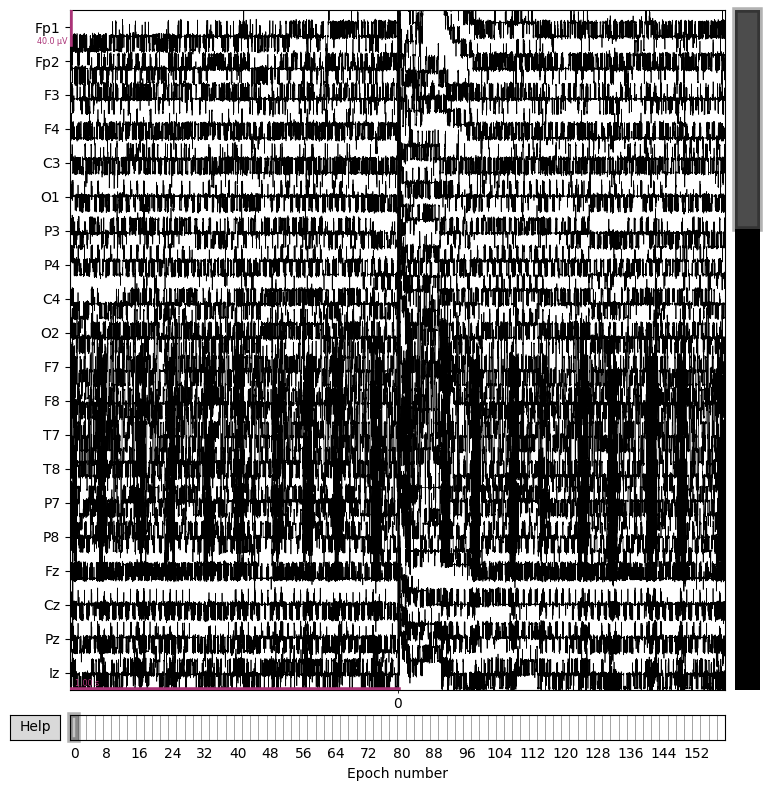

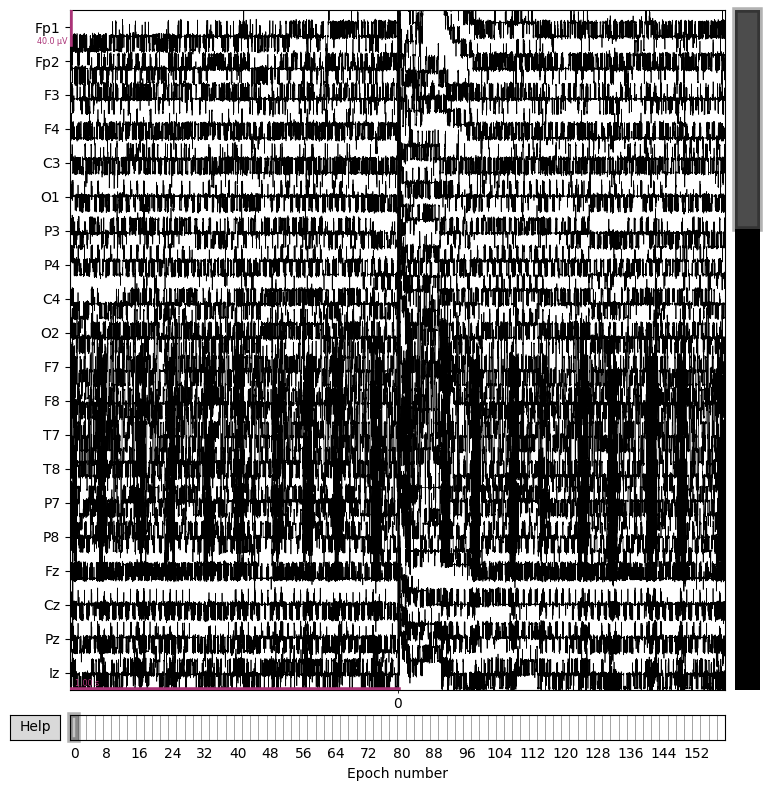

In [ ]:
event_name='Mute A'
epochs.plot(event_id={event_name: 1}, picks='all', n_epochs=1)

In [ ]:
epochs

<EpochsFIF | 80 events (all good), -1 – 1 s (baseline -1 – -0.1 s), ~757.0 MB, data loaded,
 'Mute A': 80>

In [ ]:
!pip install PyWavelets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 25.2 MB/s eta 0:00:00


In [ ]:
import pywt

In [ ]:
data = epochs.get_data()  # Shape: (n_epochs, n_channels, n_times)
data

array([[[ 1.54125826e-06,  1.97157669e-06,  1.52606276e-06, ...,
          1.20229488e-05,  2.00169561e-05,  8.29239343e-06],
        [-1.31347306e-05,  6.45439400e-07, -1.81045084e-06, ...,
         -1.05485981e-06, -3.49771398e-07, -1.75435127e-06],
        [-3.29521572e-06, -2.93494168e-06, -3.27249063e-06, ...,
         -2.55829355e-06, -3.60851391e-06, -2.64782170e-06],
        ...,
        [ 2.56803833e-06, -1.25002725e-06,  1.44866644e-05, ...,
          1.91843537e-06,  1.04865251e-06, -1.01806281e-05],
        [-4.51914332e-07, -2.94742017e-06,  1.15345911e-05, ...,
          3.31654041e-06,  1.21211197e-05, -3.49690936e-06],
        [ 3.93848904e-06,  3.67200096e-06,  8.39157747e-06, ...,
         -1.02382155e-05, -1.26054856e-05, -1.10922156e-05]],

       [[ 2.36272153e-05,  1.60344080e-05,  3.81740301e-06, ...,
         -1.16230976e-05, -1.07277219e-05, -1.15260555e-05],
        [ 1.87566923e-06,  2.78310881e-06,  1.65679251e-06, ...,
          2.79083042e-06,  1.85425677e

In [ ]:
events = epochs.events

In [ ]:
epochs.info

<Info | 11 non-empty values
 bads: []
 ch_names: Fp1, Fp2, F3, F4, C3, O1, P3, P4, C4, O2, F7, F8, T7, T8, P7, ...
 chs: 62 EEG
 custom_ref_applied: False
 dig: 65 items (3 Cardinal, 62 EEG)
 file_id: 4 items (dict)
 highpass: 0.0 Hz
 lowpass: 5000.0 Hz
 meas_date: 2024-09-12 11:46:22 UTC
 meas_id: 4 items (dict)
 nchan: 62
 projs: []
 sfreq: 10000.0 Hz
 subject_info: 5 items (dict)
>

In [ ]:
from math import floor, log2
floor(log2(len(data)))

6

i know that temporal filtering should be applied after ica according to the article that was sent to us but let's try it the usual way for eeg data. also due to the way it works i don't think it will extremely disrupt the data

In [ ]:
import numpy as np
def apply_wavelet_filter(data):
    filtered_data = []
    for epoch in data:
        coeffs = pywt.wavedec(epoch, wavelet='bior2.6', level=6)
        # Reconstruct using only the desired coefficients
        filtered_epoch = pywt.waverec(coeffs, wavelet='bior2.6')
        filtered_data.append(filtered_epoch)
    return np.array(filtered_data)

In [ ]:
import numpy as np
def apply_wavelet_filter(data):
    filtered_data = []
    for epoch in data:
        coeffs = pywt.wavedec(epoch, wavelet='bior2.6', level=6)
        # Reconstruct using only the desired coefficients
        filtered_epoch = pywt.waverec(coeffs, wavelet='bior2.6')
        filtered_data.append(filtered_epoch)
    return np.array(filtered_data)

filtered_epochs = apply_wavelet_filter(data)



In [ ]:
filtered_epochs

array([[[ 1.54125826e-06,  1.97157669e-06,  1.52606276e-06, ...,
          2.00169561e-05,  8.29239343e-06,  8.29239343e-06],
        [-1.31347306e-05,  6.45439400e-07, -1.81045084e-06, ...,
         -3.49771398e-07, -1.75435127e-06, -1.75435127e-06],
        [-3.29521572e-06, -2.93494168e-06, -3.27249063e-06, ...,
         -3.60851391e-06, -2.64782170e-06, -2.64782170e-06],
        ...,
        [ 2.56803833e-06, -1.25002725e-06,  1.44866644e-05, ...,
          1.04865251e-06, -1.01806281e-05, -1.01806281e-05],
        [-4.51914332e-07, -2.94742017e-06,  1.15345911e-05, ...,
          1.21211197e-05, -3.49690936e-06, -3.49690936e-06],
        [ 3.93848904e-06,  3.67200096e-06,  8.39157747e-06, ...,
         -1.26054856e-05, -1.10922156e-05, -1.10922156e-05]],

       [[ 2.36272153e-05,  1.60344080e-05,  3.81740301e-06, ...,
         -1.07277219e-05, -1.15260555e-05, -1.15260555e-05],
        [ 1.87566923e-06,  2.78310881e-06,  1.65679251e-06, ...,
          1.85425677e-06,  2.68924373e

In [ ]:
event_name

'Mute A'

In [ ]:
epochs.events

array([[ 121998,       0,       1],
       [ 215395,       0,       1],
       [ 252375,       0,       1],
       [ 284185,       0,       1],
       [ 319092,       0,       1],
       [ 360041,       0,       1],
       [ 414696,       0,       1],
       [ 480334,       0,       1],
       [ 768984,       0,       1],
       [ 798196,       0,       1],
       [ 861486,       0,       1],
       [ 888318,       0,       1],
       [ 914842,       0,       1],
       [ 941750,       0,       1],
       [ 969282,       0,       1],
       [1217720,       0,       1],
       [1243862,       0,       1],
       [1270084,       0,       1],
       [1296854,       0,       1],
       [1323065,       0,       1],
       [1346845,       0,       1],
       [1376338,       0,       1],
       [1400218,       0,       1],
       [1433068,       0,       1],
       [1459602,       0,       1],
       [1487970,       0,       1],
       [1514799,       0,       1],
       [1550884,       0,   

In [ ]:
# Get filtered data from filtered_epochs
#filtered_data = filtered_epochs.get_data()  # Shape: (n_epochs, n_channels, n_times)

# Check if they are identical
identical = np.array_equal(data, filtered_epochs)

# Optionally, print the result
if identical:
    print("The original and filtered data are identical.")
else:
    print("The original and filtered data are different.")


The original and filtered data are different.


In [ ]:
identical

False

Not setting metadata
80 matching events found
Applying baseline correction (mode: mean)
0 projection items activated


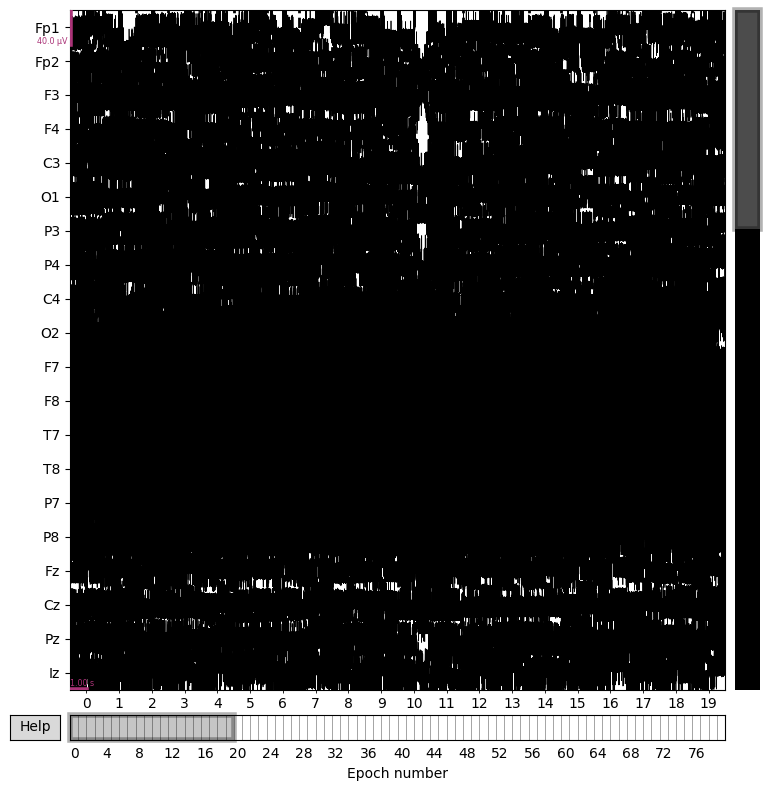

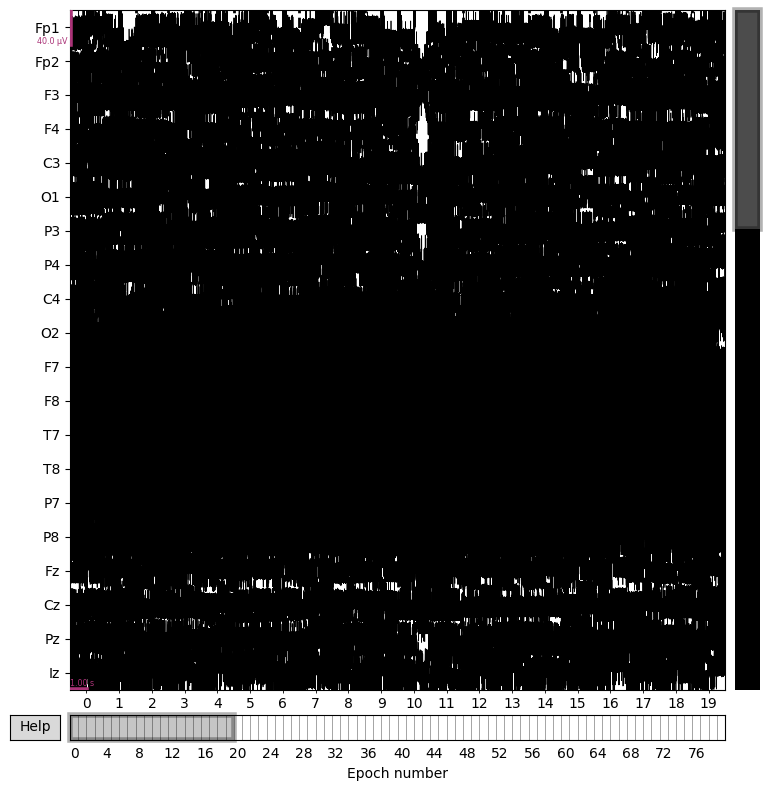

In [ ]:


filtered_epochs = mne.EpochsArray(
    filtered_epochs,            # Your filtered data
    info=epochs.info,        # Original metadata
    events=epochs.events,     # Original events
    tmin=epochs.tmin,        # Original tmin
    baseline=epochs.baseline  # Original baseline
)
# Plot the filtered epochs
filtered_epochs.plot()

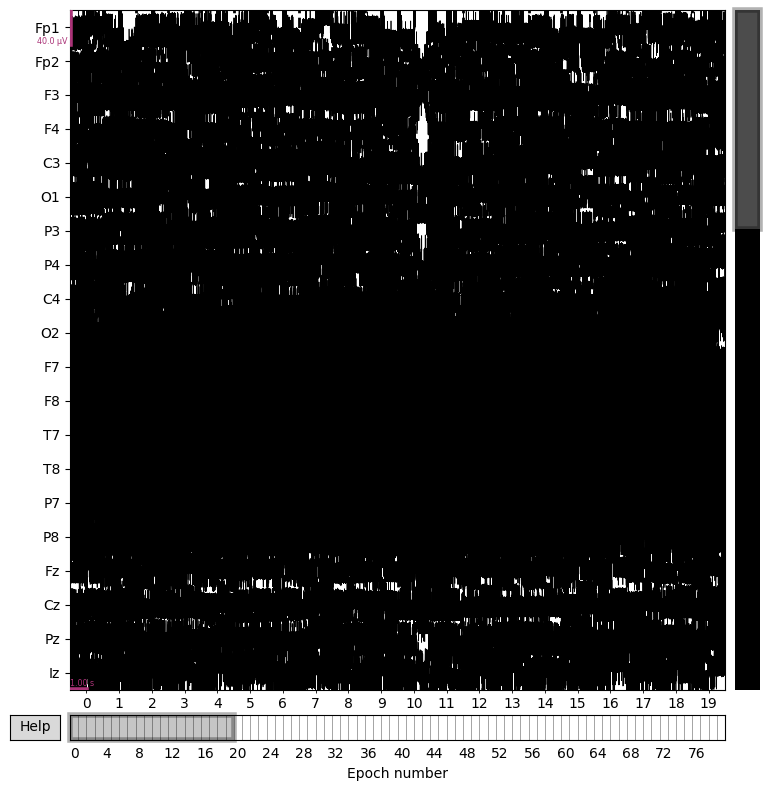

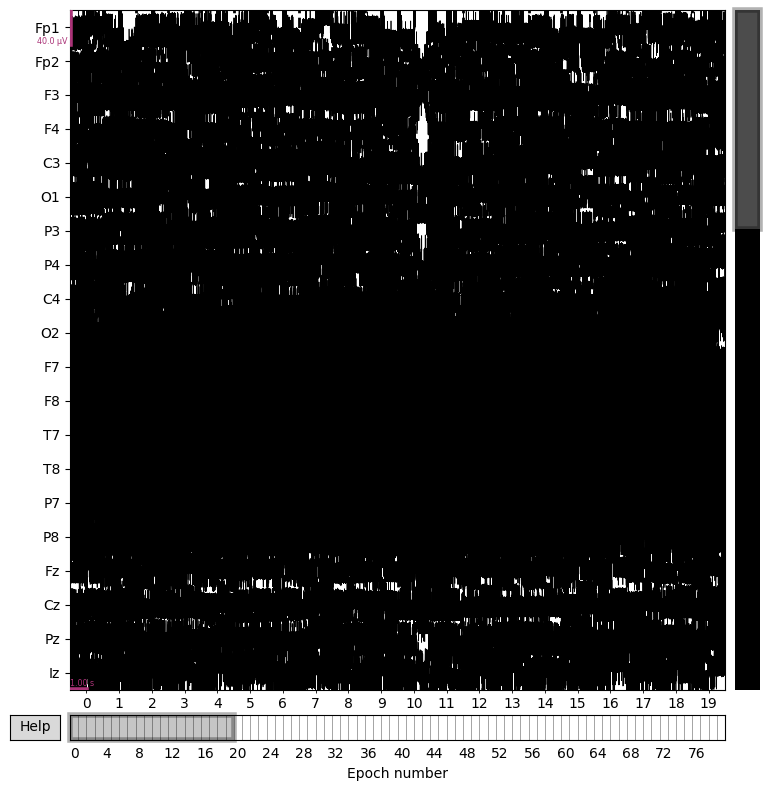

In [ ]:
filtered_epochs.plot()

looks worse than the original seems like i'm just braindead

In [ ]:
filtered_epochs.ch_names

['Fp1',
 'Fp2',
 'F3',
 'F4',
 'C3',
 'O1',
 'P3',
 'P4',
 'C4',
 'O2',
 'F7',
 'F8',
 'T7',
 'T8',
 'P7',
 'P8',
 'Fz',
 'Cz',
 'Pz',
 'Iz',
 'FC1',
 'FC2',
 'CP1',
 'CP2',
 'FC5',
 'FC6',
 'CP5',
 'CP6',
 'TP9',
 'TP10',
 'F1',
 'F2',
 'C1',
 'C2',
 'P1',
 'P2',
 'AF3',
 'AF4',
 'FC3',
 'FC4',
 'CP3',
 'CP4',
 'PO3',
 'PO4',
 'F5',
 'F6',
 'C5',
 'C6',
 'P5',
 'P6',
 'AF7',
 'AF8',
 'FT7',
 'FT8',
 'TP7',
 'TP8',
 'PO7',
 'PO8',
 'Fpz',
 'CPz',
 'POz',
 'Oz']

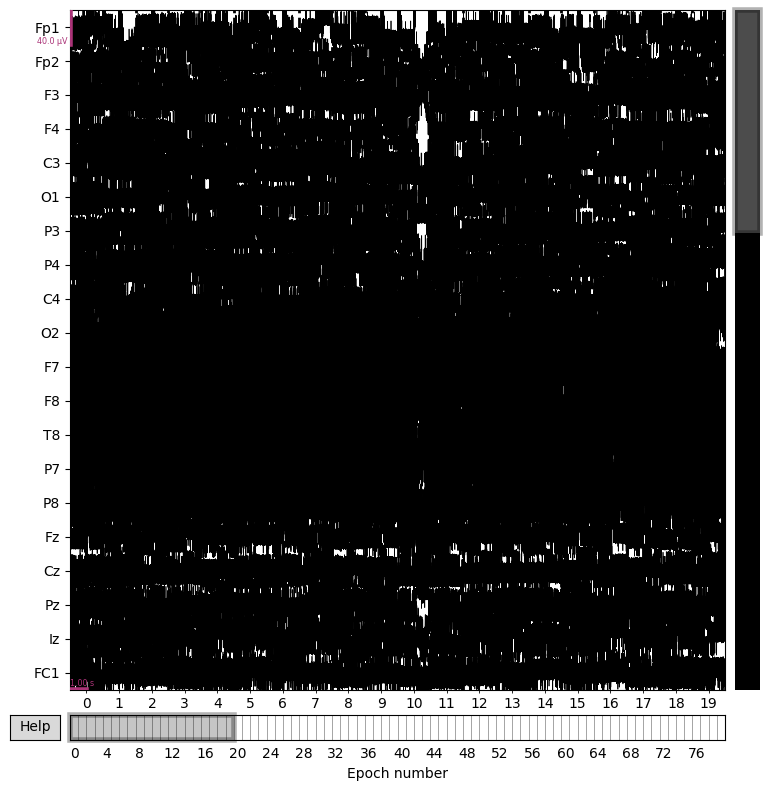

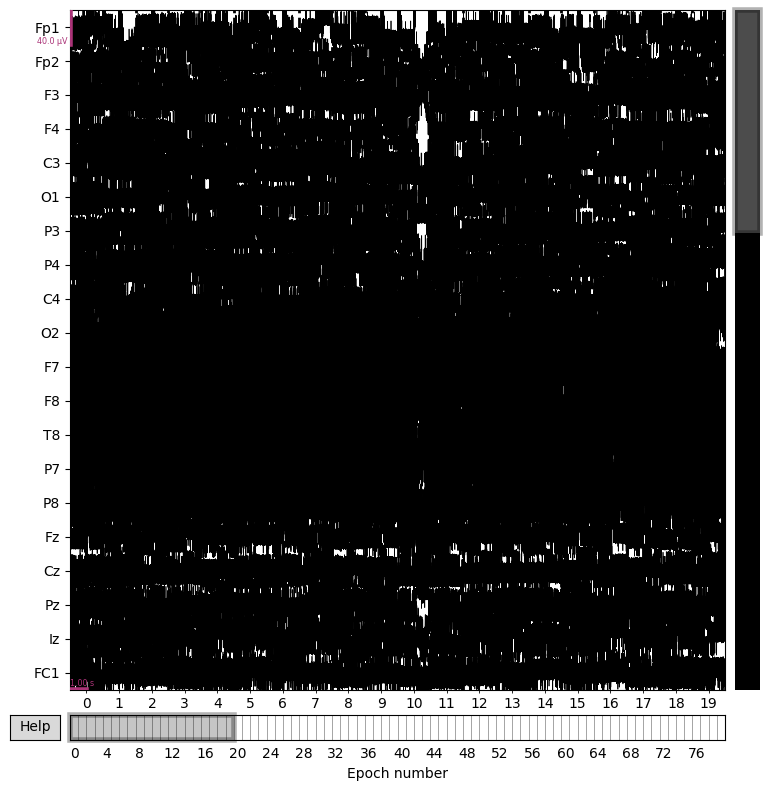

In [ ]:
ch_names = filtered_epochs.ch_names
drop = 'T7'
filtered_epochs_new = filtered_epochs.drop_channels(drop)
filtered_epochs_new.plot()

In [ ]:
from scipy.signal import iirnotch, filtfilt
target_freq = 50.0  # Целевая частота
Q = target_freq/5  # Добротность нотч фильтра
fs = 10000.0

def notch_filter_scipy(data, fs, target_freq, Q):
    nyq = 0.5 * fs
    notch_freq = target_freq / nyq
    b, a = iirnotch(notch_freq, Q)
    filtered_data = filtfilt(b, a, data)
    return filtered_data

In [ ]:
N = 19  # desired end value
numbers = list(range(0, N+1))

In [ ]:
import matplotlib.pyplot as plt
from mne.preprocessing import ICA

<ipython-input-31-2369f4ce2524>:4: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(filtered_epochs_new, verbose=False)
<ipython-input-31-2369f4ce2524>:4: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.
  ica.fit(filtered_epochs_new, verbose=False)


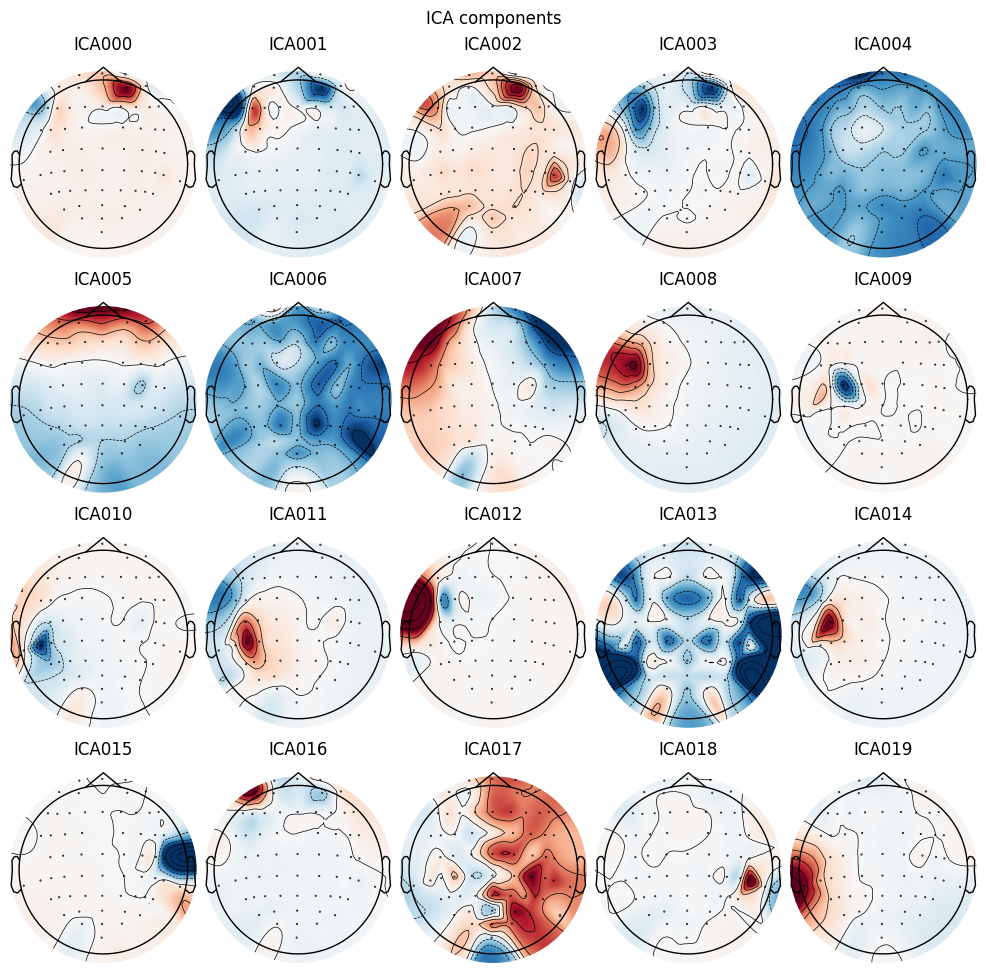

Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,45 iterations on epochs (1600160 samples)
ICA components,41
Available PCA components,61
Channel types,eeg
ICA components marked for exclusion,—


In [ ]:

ica = ICA(n_components=0.99, max_iter='auto', random_state=42, verbose=False)
ica.fit(filtered_epochs_new, verbose=False)
ica.plot_components(picks=numbers)
plt.show()
ica

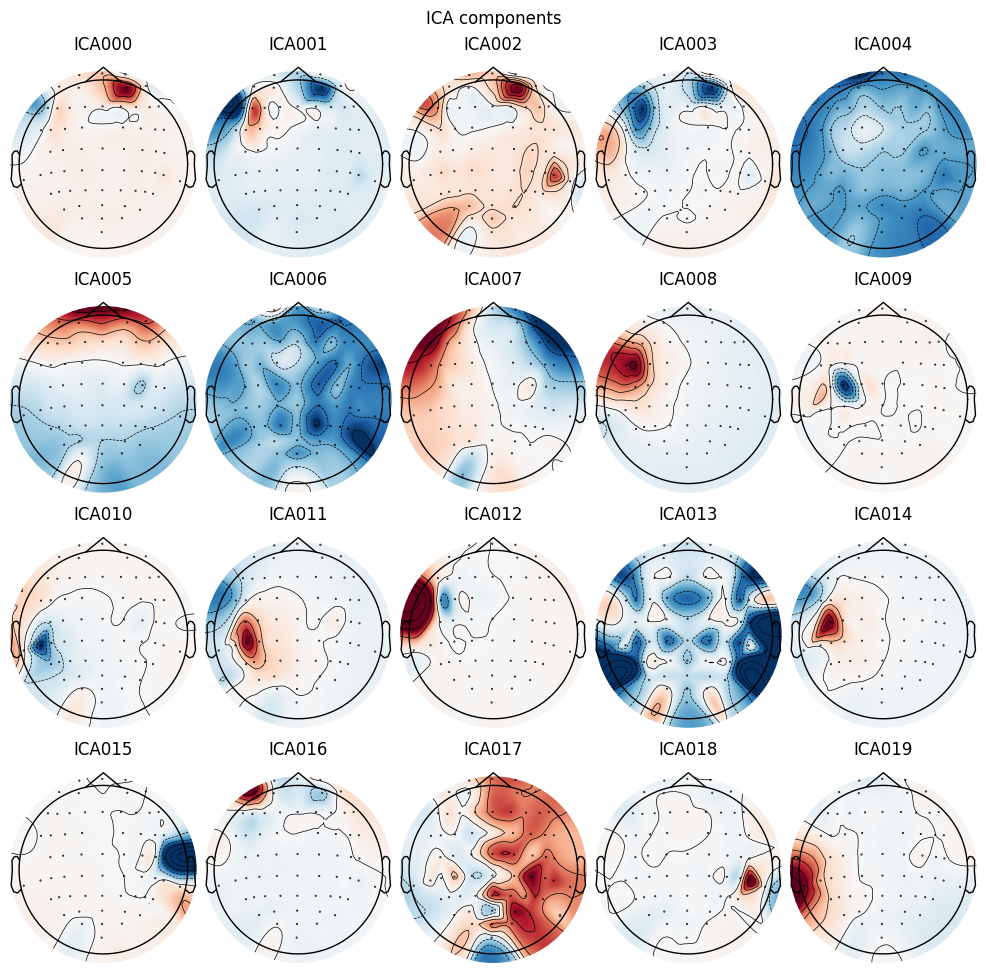

In [ ]:
ica.plot_components(picks=numbers)
plt.show()

Not setting metadata
80 matching events found
No baseline correction applied
0 projection items activated


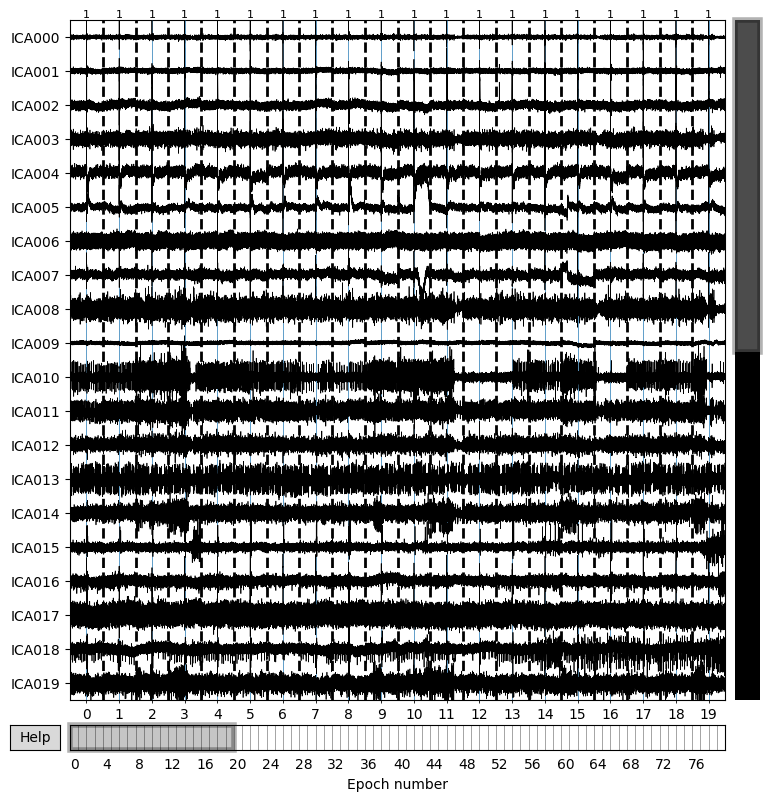

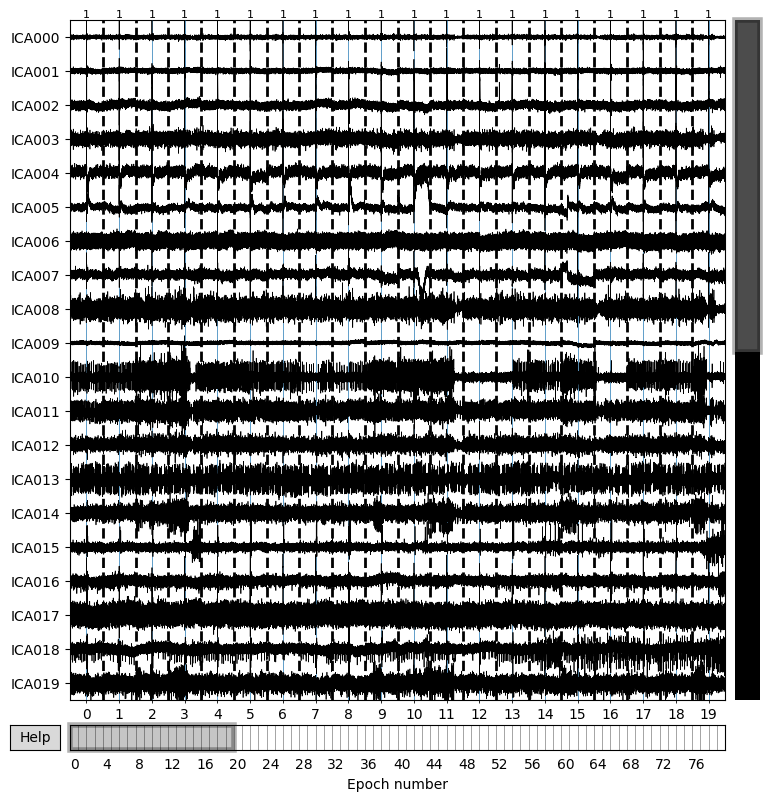

In [ ]:
ica.plot_sources(filtered_epochs_new)

In [ ]:
ica.exclude = [0, 5, 7, 4]

Applying ICA to Evoked instance
    Transforming to ICA space (41 components)
    Zeroing out 4 ICA components
    Projecting back using 61 PCA components


<ipython-input-35-1ef5ccb02803>:1: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  ica.plot_overlay(filtered_epochs_new.average(), exclude=ica.exclude, picks="eeg")


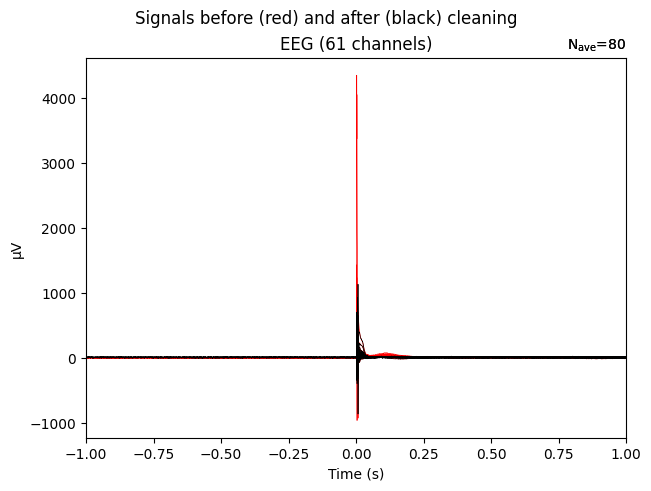

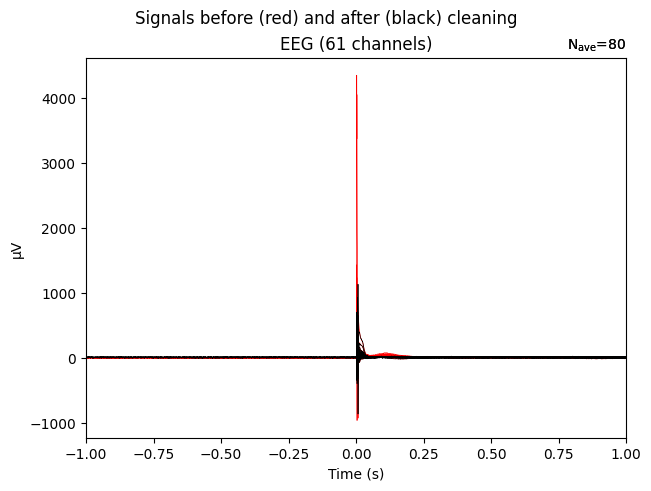

In [ ]:
ica.plot_overlay(filtered_epochs_new.average(), exclude=ica.exclude, picks="eeg")

In [ ]:
ica.apply(filtered_epochs_new)

Applying ICA to Epochs instance


<ipython-input-36-64452cad8946>:1: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  ica.apply(filtered_epochs_new)


    Transforming to ICA space (41 components)
    Zeroing out 4 ICA components
    Projecting back using 61 PCA components


<EpochsArray | 80 events (all good), -1 – 1 s (baseline -1 – -0.1 s), ~744.8 MB, data loaded,
 '1': 80>

In [ ]:
f_epochs = filtered_epochs_new.apply_function(notch_filter_scipy, picks='all', dtype=np.float64, n_jobs=1, fs=fs, target_freq=target_freq, Q=Q)

In [ ]:
f_epochs.filter(l_freq=0.5, h_freq=45)

Setting up band-pass filter from 0.5 - 45 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 45.00 Hz
- Upper transition bandwidth: 11.25 Hz (-6 dB cutoff frequency: 50.62 Hz)
- Filter length: 66001 samples (6.600 s)



<ipython-input-38-4cbcaba3f449>:1: RuntimeWarning: filter_length (66001) is longer than the signal (20002), distortion is likely. Reduce filter length or filter a longer signal.
  f_epochs.filter(l_freq=0.5, h_freq=45)
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    1.6s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    2.5s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    3.6s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    5.0s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    6.5s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    8.3s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:   11.0s
[Parallel(n_jobs=1)]: Done 2177 tasks      | elapsed:   14.1s
[Parallel(n_jobs=1)]: Done 2591 tasks      | elapsed:   16.3s
[Parallel(n_jobs=1)]: Done 3041 tasks      |

<EpochsArray | 80 events (all good), -1 – 1 s (baseline -1 – -0.1 s), ~744.8 MB, data loaded,
 '1': 80>

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Plotting power spectral density (dB=True).
Averaging across epochs before plotting...


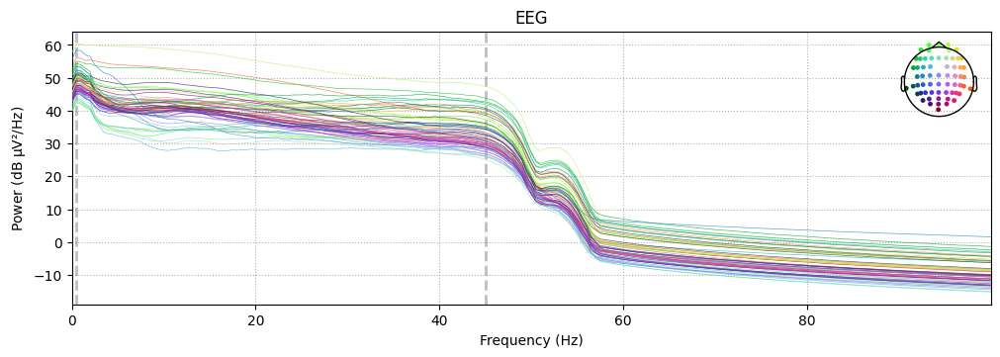

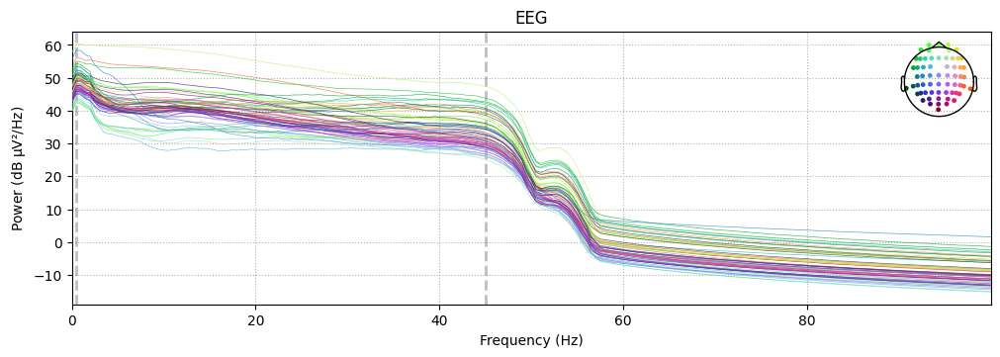

In [ ]:
f_epochs.plot_psd(fmin=0,fmax=100)

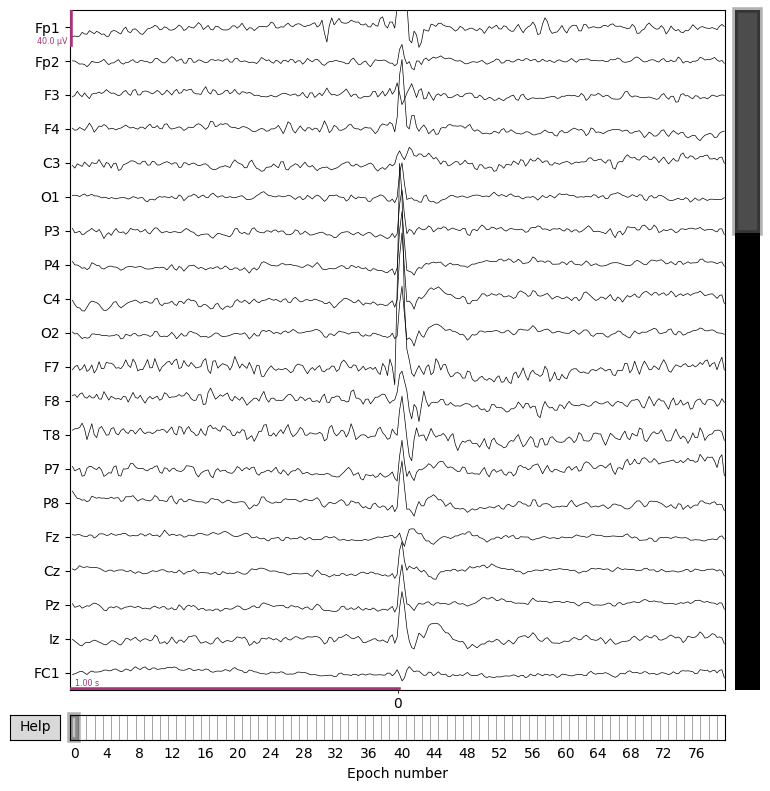

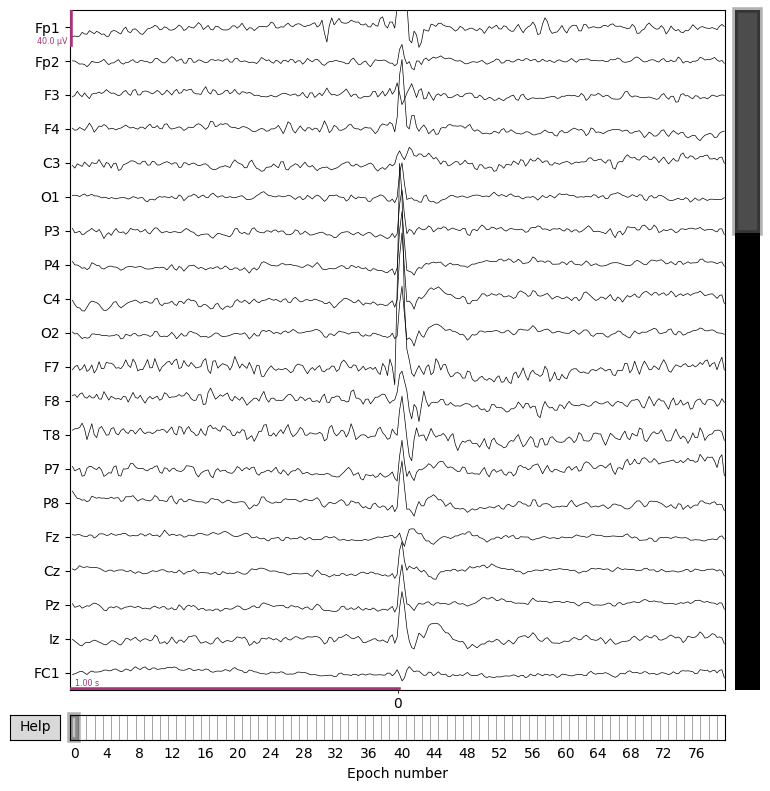

In [ ]:
epochs_icaed = f_epochs.copy()
epochs_icaed.plot(n_epochs = 1)

<ipython-input-41-6da03bc02b77>:2: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.
  ica_2.fit(epochs_icaed, verbose=False)


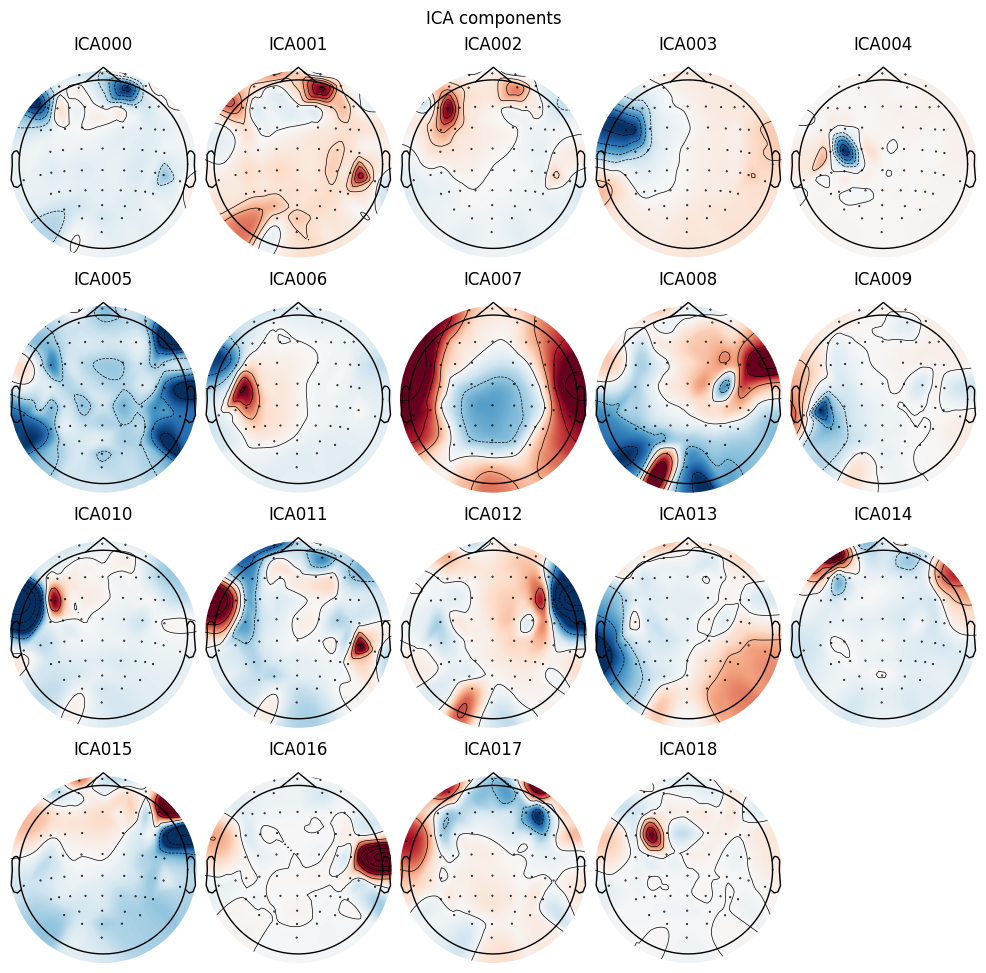

Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,34 iterations on epochs (1600160 samples)
ICA components,19
Available PCA components,61
Channel types,eeg
ICA components marked for exclusion,—


In [ ]:
ica_2 = ICA(n_components= N, max_iter='auto', random_state=97, verbose=False)
ica_2.fit(epochs_icaed, verbose=False)
ica_2.plot_components()
plt.show()
ica_2

Not setting metadata
80 matching events found
No baseline correction applied
0 projection items activated


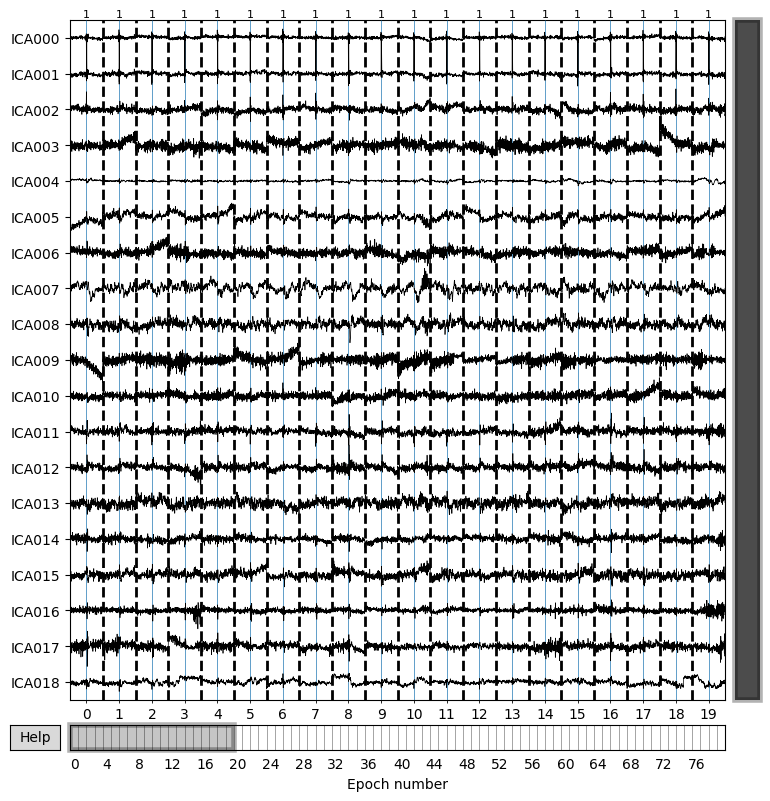

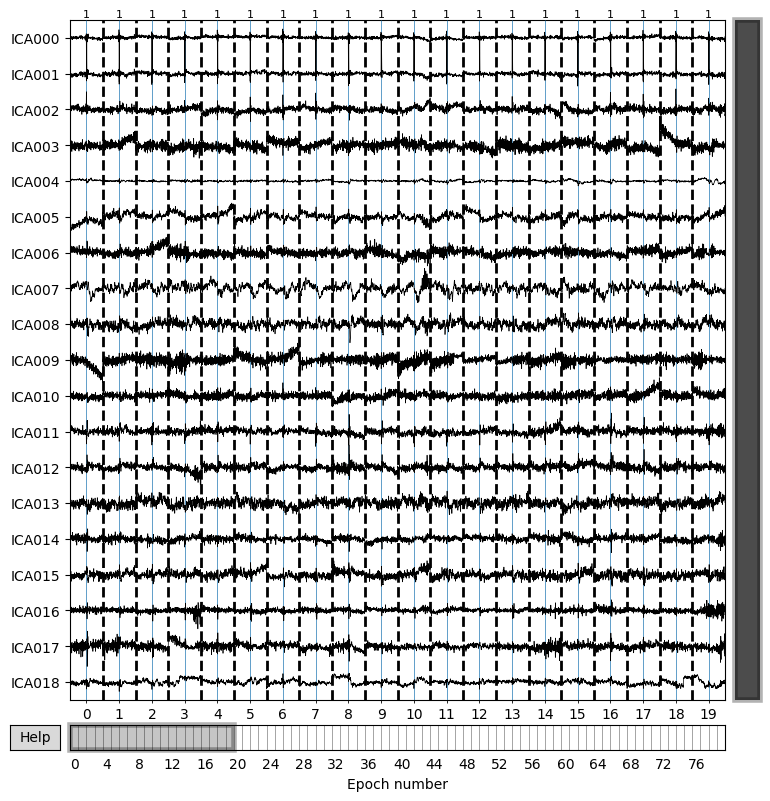

In [ ]:
ica_2.plot_sources(epochs_icaed)

In [ ]:
ica_2.exclude = [0, 2]

Applying ICA to Evoked instance
    Transforming to ICA space (19 components)
    Zeroing out 2 ICA components
    Projecting back using 61 PCA components


<ipython-input-44-eaf84d086f7f>:1: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  ica_2.plot_overlay(epochs_icaed.average(), exclude=ica_2.exclude, picks="eeg")


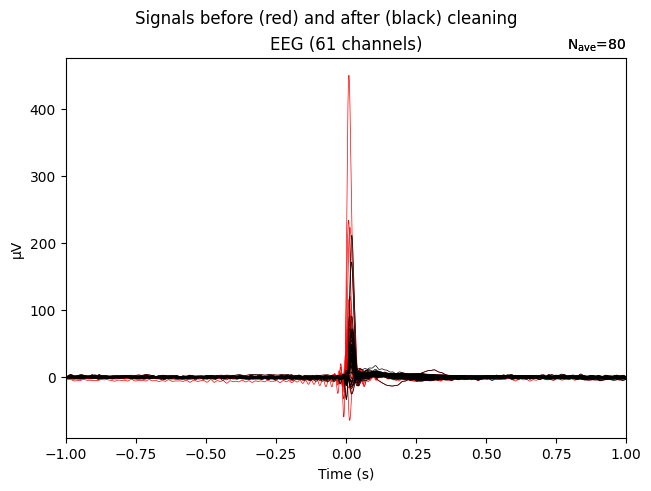

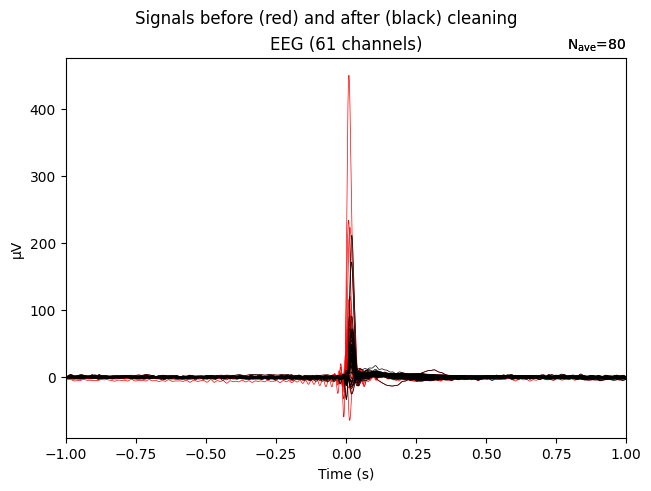

In [ ]:
ica_2.plot_overlay(epochs_icaed.average(), exclude=ica_2.exclude, picks="eeg")

In [ ]:
ica_2.apply(epochs_icaed)

Applying ICA to Epochs instance


<ipython-input-45-b00faf8d6a36>:1: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  ica_2.apply(epochs_icaed)


    Transforming to ICA space (19 components)
    Zeroing out 2 ICA components
    Projecting back using 61 PCA components


<EpochsArray | 80 events (all good), -1 – 1 s (baseline -1 – -0.1 s), ~744.8 MB, data loaded,
 '1': 80>

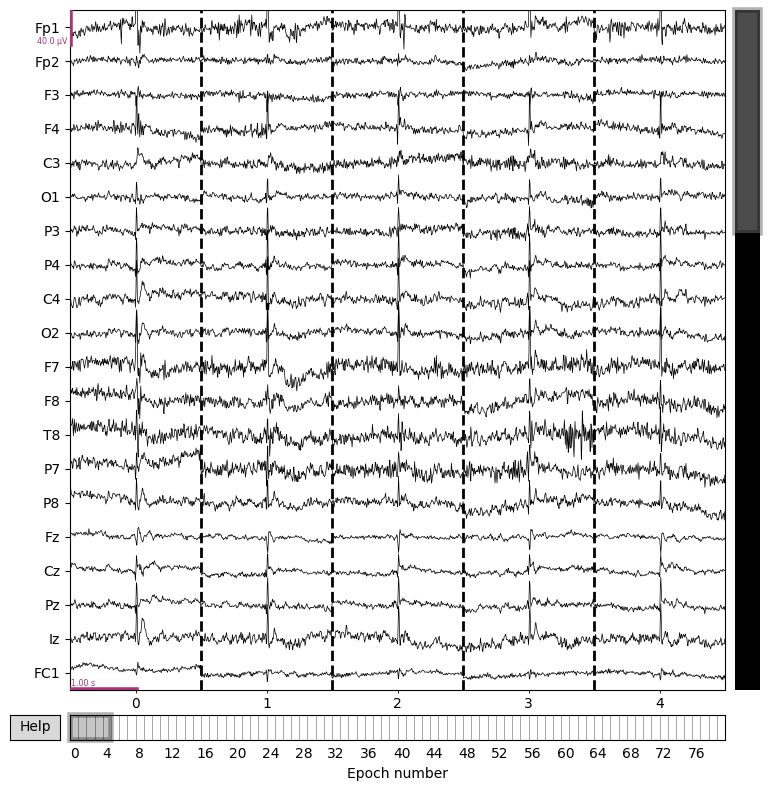

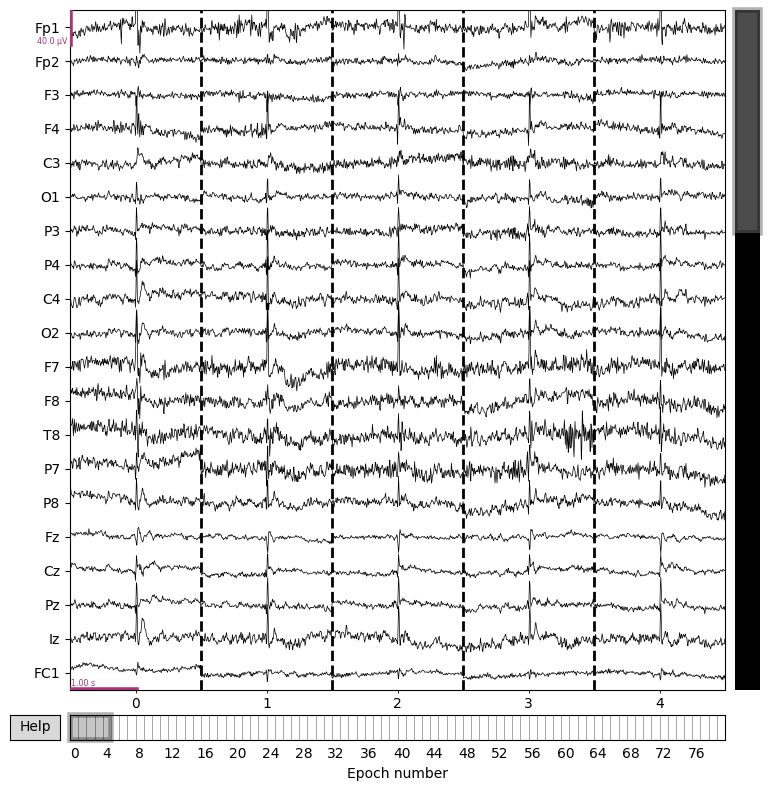

In [ ]:
epochs_icaed.plot(n_epochs = 5)

In [ ]:
epochs_icaed.interpolate_bads()#method="MNE")

Setting channel interpolation method to {'eeg': 'spline'}.


<ipython-input-47-bcdcbb260355>:1: RuntimeWarning: No bad channels to interpolate. Doing nothing...
  epochs_icaed.interpolate_bads()#method="MNE")


<EpochsArray | 80 events (all good), -1 – 1 s (baseline -1 – -0.1 s), ~744.8 MB, data loaded,
 '1': 80>

In [ ]:
epochs_icaed.set_eeg_reference('average')
epochs_icaed.apply_baseline(baseline=(-0.5,-0.1))

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Applying baseline correction (mode: mean)


<EpochsArray | 80 events (all good), -1 – 1 s (baseline -0.5 – -0.1 s), ~744.8 MB, data loaded,
 '1': 80>

In [ ]:
epochs_ave_mean = epochs_icaed.copy().crop(0, 0.2).average()

No projector specified for this dataset. Please consider the method self.add_proj.


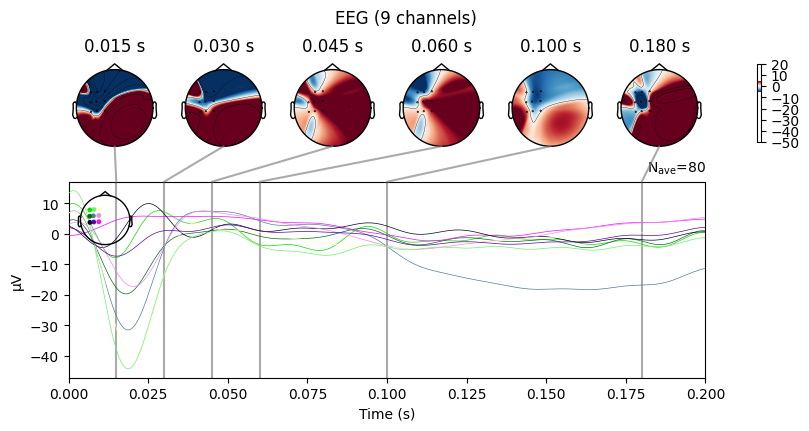

In [ ]:
epochs_ave_mean.plot_joint([0.015,0.03, 0.045, 0.06,0.1, 0.18], picks = ["C3", "CP5", "C5", "CP3", "CP1", "C1", "FC1", "FC3", "FC5"], topomap_args = {'vlim':(-5,5)})
plt.show()

No projector specified for this dataset. Please consider the method self.add_proj.


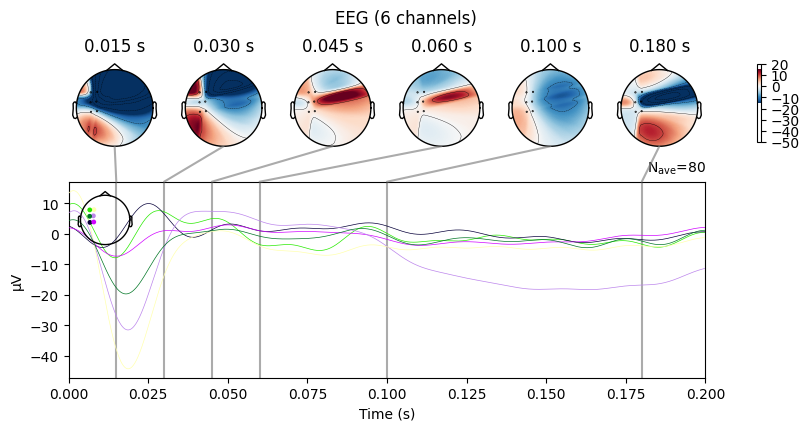

In [ ]:
epochs_ave_mean.plot_joint([0.015,0.03, 0.045, 0.06,0.1, 0.18], picks = ["C3", "CP5", "C5", "CP3", "FC3", "FC5"], topomap_args = {'vlim':(-15,15)})
plt.show()

No projector specified for this dataset. Please consider the method self.add_proj.


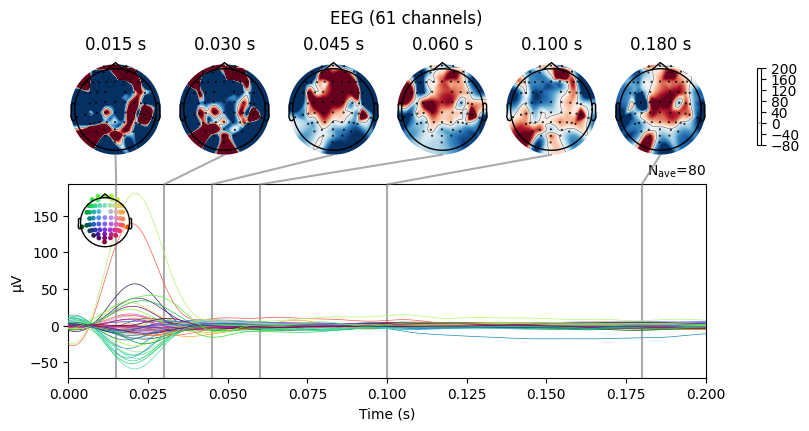

In [ ]:
epochs_ave_mean.plot_joint([0.015, 0.03, 0.045, 0.06, 0.1, 0.18], topomap_args = {'vlim':(-5,5)})
plt.show()

In [ ]:
epochs_icaed.save('rest1_epo.fif', overwrite=True)

In [ ]:
epochs_icaed = mne.read_epochs('/content/drive/MyDrive/rest1_epo.fif')

Reading /content/drive/MyDrive/rest1_epo.fif ...
    Found the data of interest:
        t =   -1000.00 ...    1000.10 ms
        0 CTF compensation matrices available
Not setting metadata
80 matching events found
No baseline correction applied
0 projection items activated


In [ ]:
epochs_icaed = epochs_icaed.resample(500)

In [ ]:
epochs_icaed_ar = epochs_icaed.get_data()

In [ ]:
epochs_icaed_ar.shape

(80, 61, 1000)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

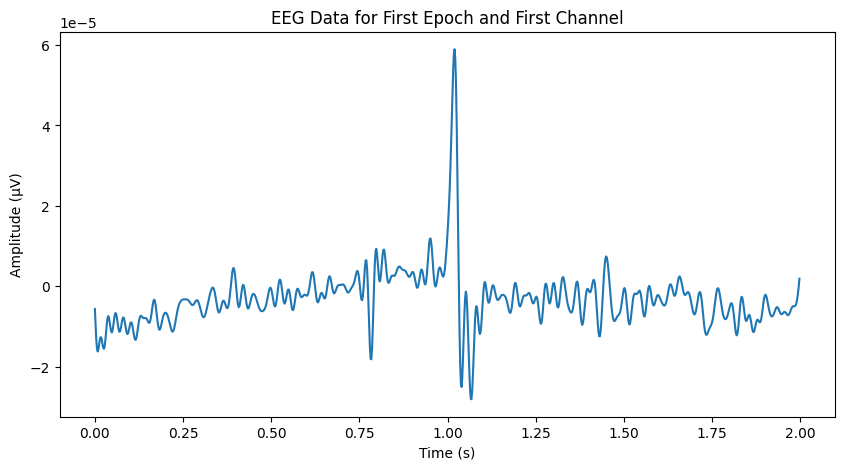

In [ ]:
# Get data for the first epoch and a specific channel
epoch_data = epochs_icaed.get_data()
first_epoch = epoch_data[0]  # First epoch
channel_data = first_epoch[0]  # Data for the first channel

# Time vector based on sampling frequency
sfreq = epochs_icaed.info['sfreq']
times = np.arange(0, len(channel_data)) / sfreq

# Plot
plt.figure(figsize=(10, 5))
plt.plot(times, channel_data)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.title('EEG Data for First Epoch and First Channel')
plt.show()


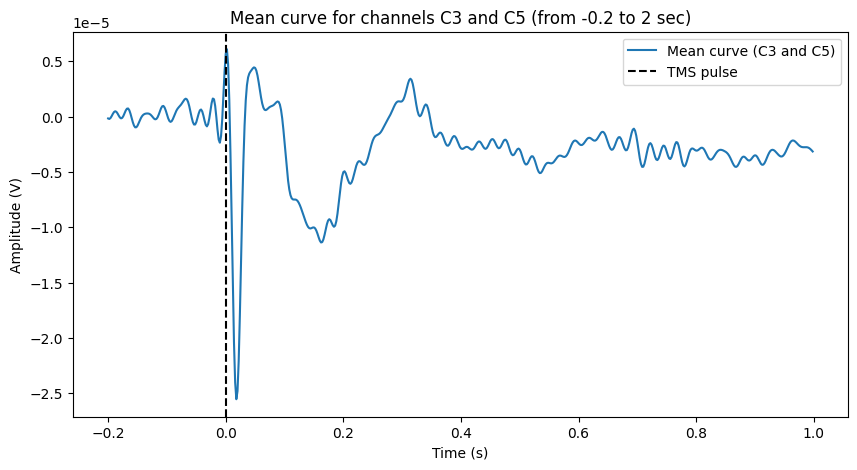

In [ ]:
# Extract data for channels C3 and C5
channels_of_interest = ['C3', 'C5']
epochs_data = epochs_icaed.get_data(picks=channels_of_interest)  # Get data only for channels C3 and C5

# Average data across epochs
mean_data = np.mean(epochs_data, axis=0)

# Mean of the two channels (C3 and C5)
mean_channels = np.mean(mean_data, axis=0)

# Time in seconds
sfreq = epochs_icaed.info['sfreq']
times = np.arange(mean_channels.shape[0]) / sfreq + epochs_icaed.tmin  # Add tmin to start time from -1 sec

# Indices for the time range from -0.2 to 2 seconds
start_idx = np.searchsorted(times, -0.2)
end_idx = np.searchsorted(times, 2.0)

# Slice the data and time
times_segment = times[start_idx:end_idx]
mean_channels_segment = mean_channels[start_idx:end_idx]

# Plotting the graph
plt.figure(figsize=(10, 5))
plt.plot(times_segment, mean_channels_segment, label='Mean curve (C3 and C5)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (V)')
plt.title('Mean curve for channels C3 and C5 (from -0.2 to 2 sec)')
plt.axvline(0, color='k', linestyle='--', label='TMS pulse')  # Vertical line at 0 to indicate the TMS pulse
plt.legend()
plt.show()

In [ ]:
epochsi = mne.read_epochs('/content/drive/MyDrive/MI.fif', preload=True)

Reading /content/drive/MyDrive/MI.fif ...


<ipython-input-21-a386dcc2d5a7>:1: RuntimeWarning: This filename (/content/drive/MyDrive/MI.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochsi = mne.read_epochs('/content/drive/MyDrive/MI.fif', preload=True)


    Found the data of interest:
        t =   -1000.00 ...    1000.00 ms
        0 CTF compensation matrices available
Not setting metadata
80 matching events found
No baseline correction applied
0 projection items activated


In [ ]:
data1 = epochsi.get_data()  # Shape: (n_epochs, n_channels, n_times)
data1

array([[[ 2.42613260e-05,  1.71873235e-05,  1.90153787e-05, ...,
          2.38085941e-05,  3.13582132e-05,  2.81065459e-05],
        [ 1.95001871e-06,  1.10067992e-06,  1.84115083e-06, ...,
          3.21430962e-05,  3.53214236e-05,  2.04677563e-05],
        [ 1.09719540e-05,  1.04844721e-05,  1.09402918e-05, ...,
          2.87156254e-05,  2.54690440e-05,  2.76481842e-05],
        ...,
        [ 3.37615279e-06,  3.31444835e-06,  3.37642700e-06, ...,
          3.07952155e-06,  3.62520200e-06,  3.04697846e-06],
        [ 7.77020068e-06,  7.96972927e-06,  7.76013349e-06, ...,
          7.70741190e-06,  7.92637638e-06,  7.90224567e-06],
        [ 1.29196123e-05,  1.35765022e-05,  1.28161655e-05, ...,
          1.29833616e-05,  1.34709599e-05,  1.29746231e-05]],

       [[-6.69623796e-06, -5.58292004e-06, -6.20710443e-06, ...,
          2.56557396e-05,  2.62064095e-05,  2.56616477e-05],
        [ 5.69243980e-07, -7.32175408e-07,  5.19360071e-07, ...,
          3.16990227e-05,  3.20993677e

In [ ]:
filtered_epochs1 = apply_wavelet_filter(data1)


Not setting metadata
80 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using matplotlib as 2D backend.


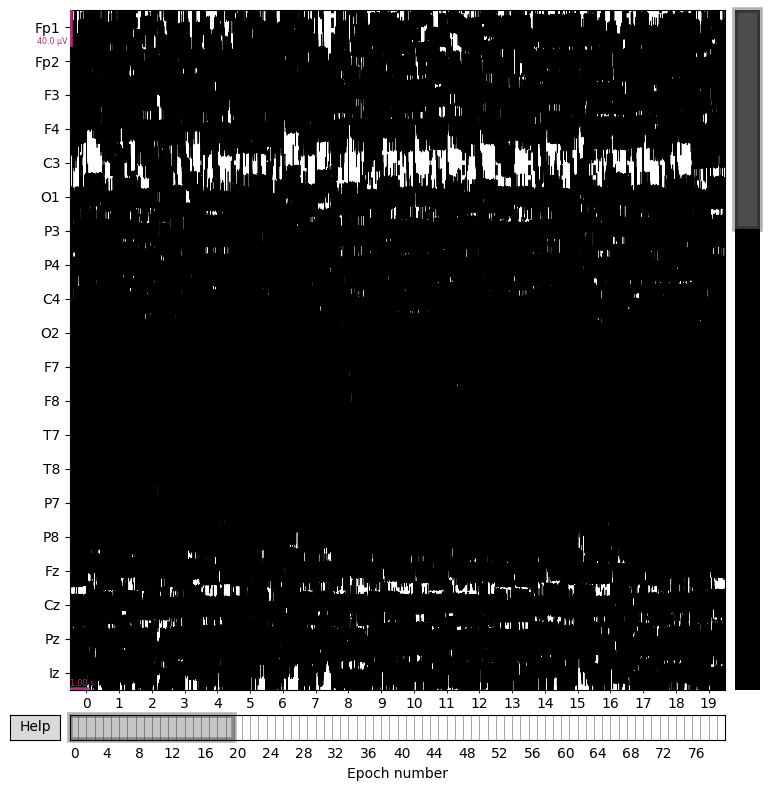

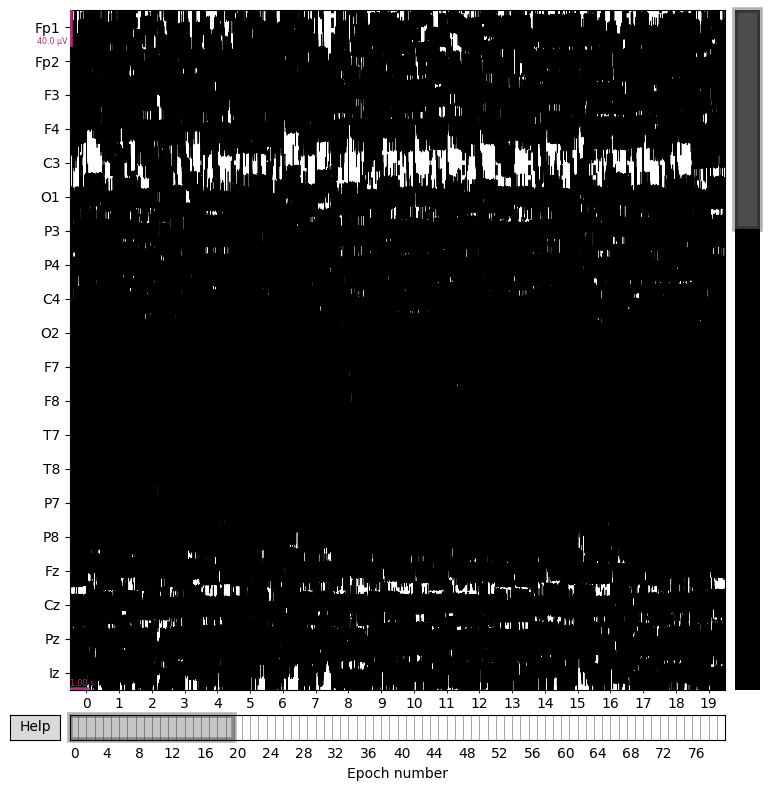

In [ ]:
filtered_epochs1 = mne.EpochsArray(
    filtered_epochs1,            # Your filtered data
    info=epochsi.info,        # Original metadata
    events=epochsi.events,     # Original events
    tmin=epochsi.tmin,        # Original tmin
    baseline=epochsi.baseline  # Original baseline
)
# Plot the filtered epochs
filtered_epochs1.plot()

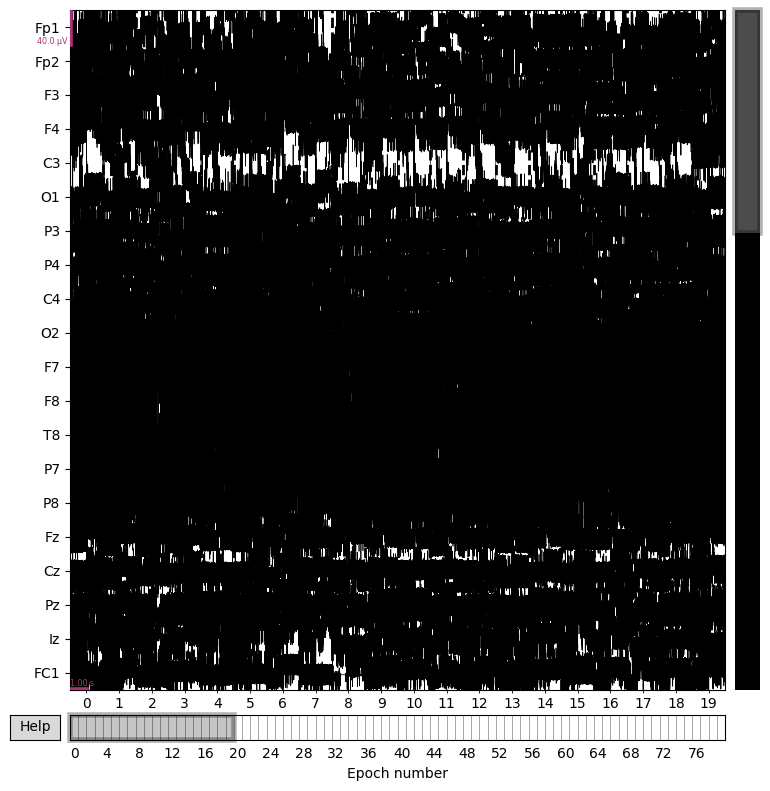

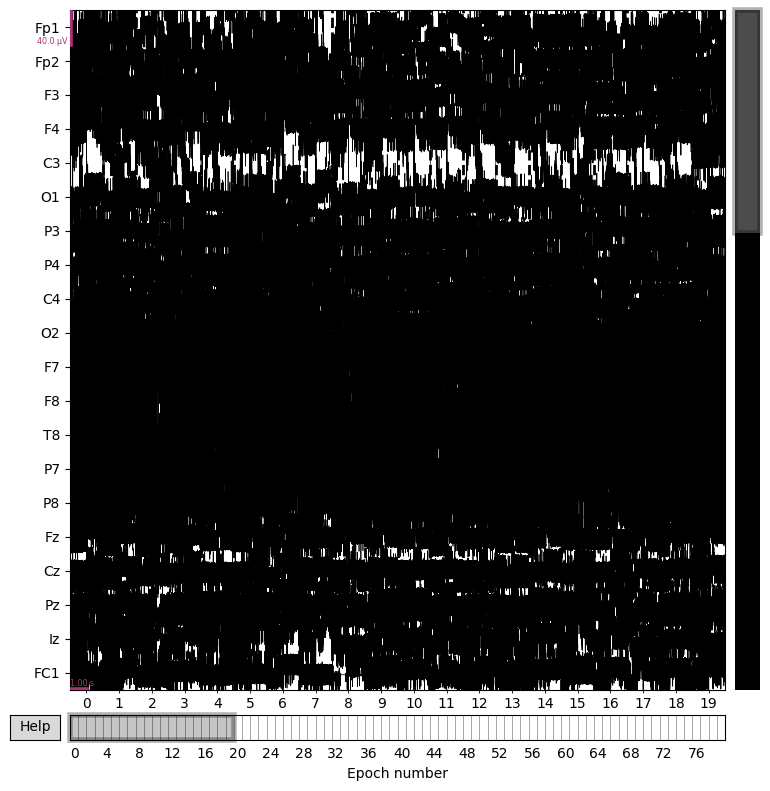

In [ ]:
ch_names = filtered_epochs1.ch_names
drop = 'T7'
filtered_epochs_new1 = filtered_epochs1.drop_channels(drop)
filtered_epochs_new1.plot()

<ipython-input-27-939ca404434e>:2: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  icai.fit(filtered_epochs_new1, verbose=False)
<ipython-input-27-939ca404434e>:2: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.
  icai.fit(filtered_epochs_new1, verbose=False)


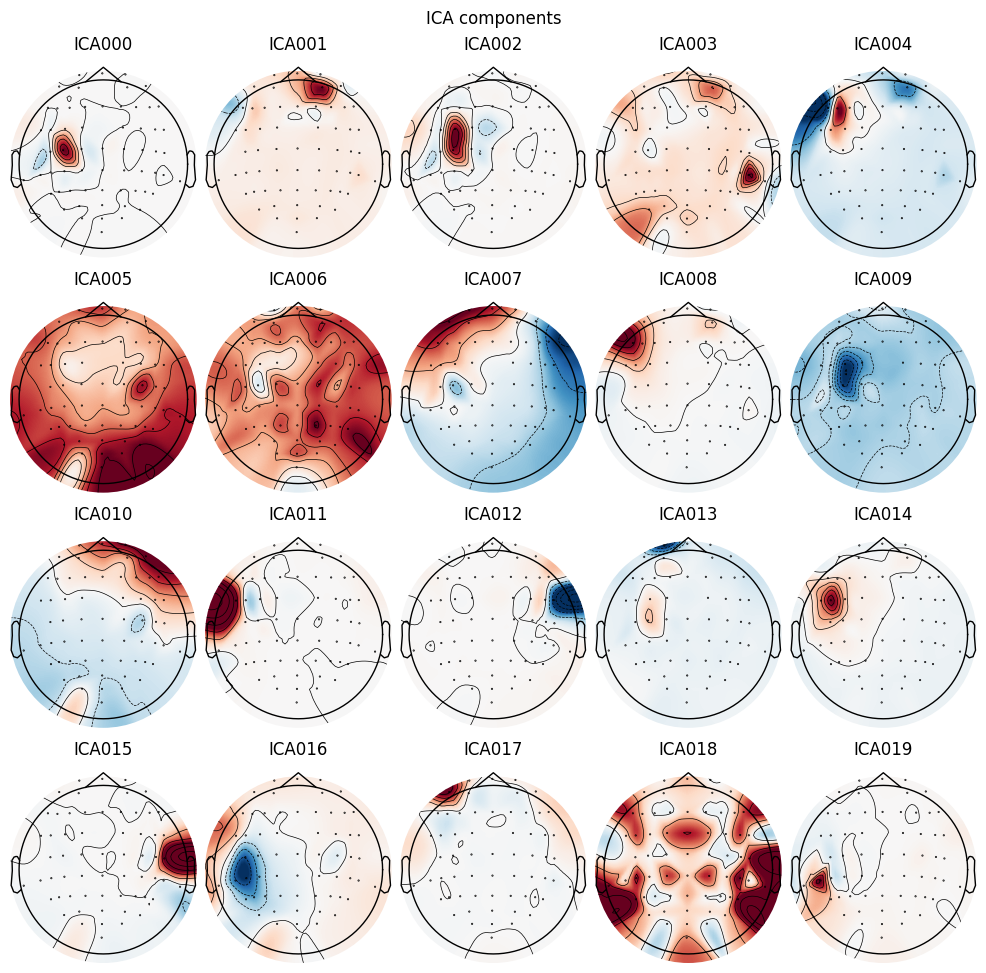

Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,34 iterations on epochs (1600160 samples)
ICA components,35
Available PCA components,61
Channel types,eeg
ICA components marked for exclusion,—


In [ ]:
icai = ICA(n_components=0.99, max_iter='auto', random_state=42, verbose=False)
icai.fit(filtered_epochs_new1, verbose=False)
icai.plot_components(picks=numbers)
plt.show()
icai

Not setting metadata
80 matching events found
No baseline correction applied
0 projection items activated


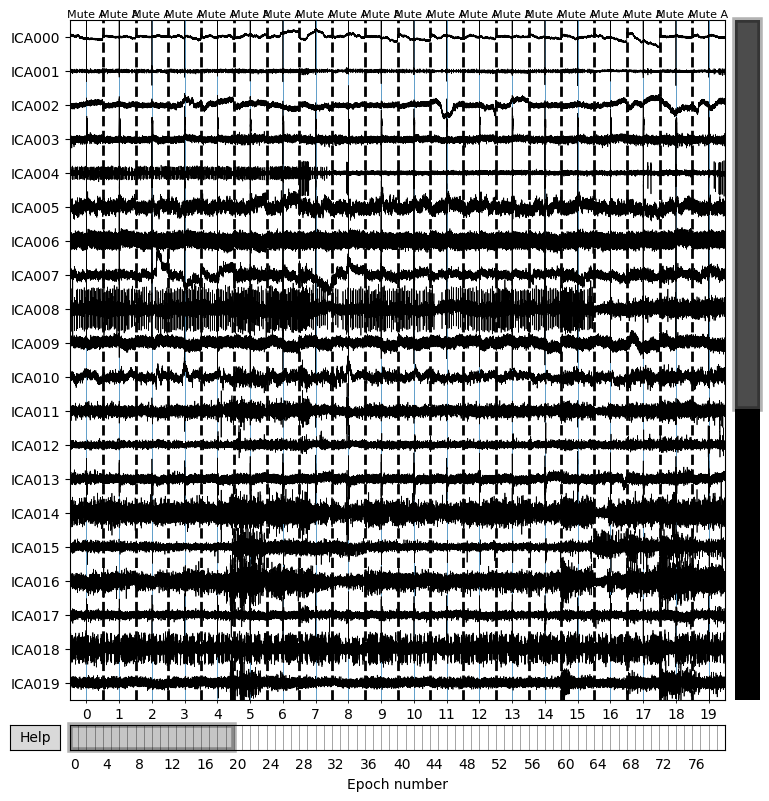

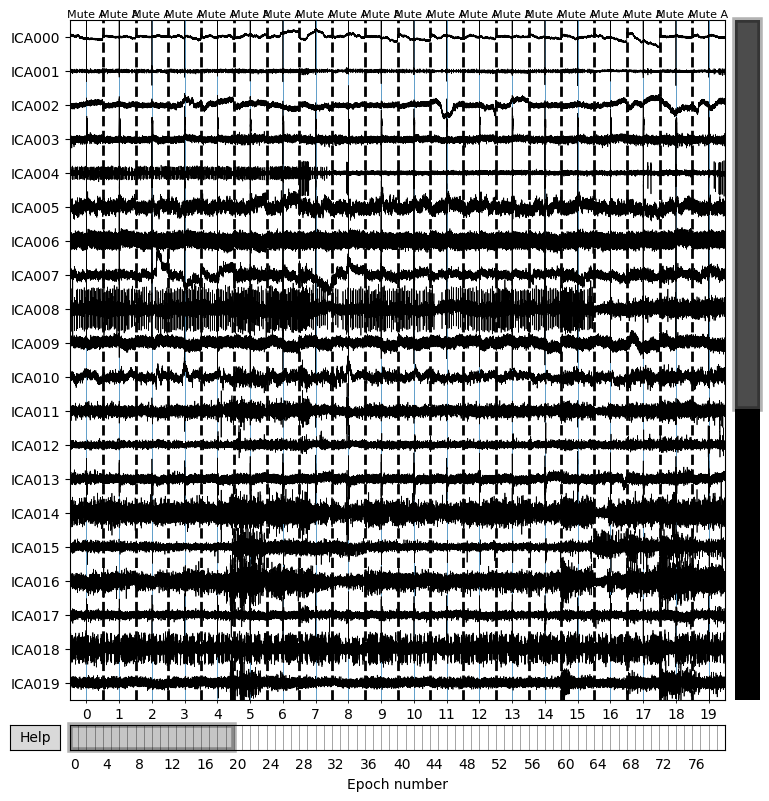

In [ ]:
icai.plot_sources(epochsi)

In [ ]:
icai.exclude = [0,2,7,5]

Applying ICA to Evoked instance
    Transforming to ICA space (35 components)
    Zeroing out 4 ICA components
    Projecting back using 61 PCA components


<ipython-input-30-3cc2b6177657>:1: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  icai.plot_overlay(epochsi.average(), exclude=icai.exclude, picks="eeg")


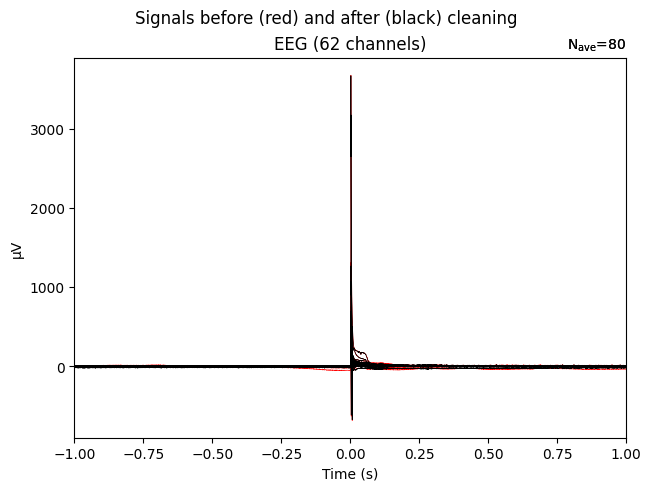

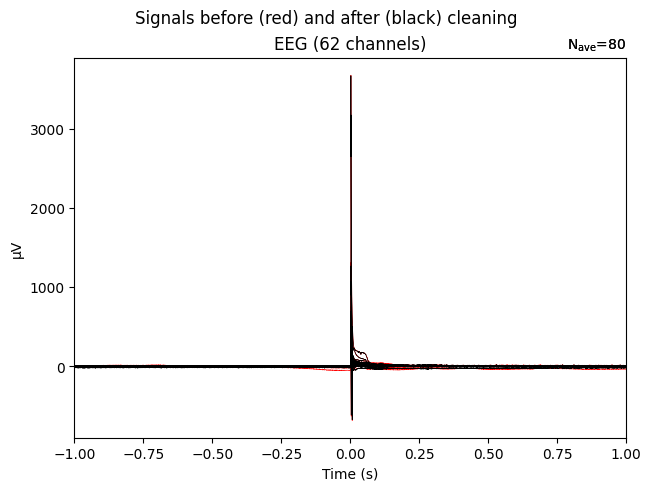

In [ ]:
icai.plot_overlay(epochsi.average(), exclude=icai.exclude, picks="eeg")

In [ ]:
icai.apply(filtered_epochs_new1)

Applying ICA to Epochs instance


<ipython-input-31-a926662d9af0>:1: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  icai.apply(filtered_epochs_new1)


    Transforming to ICA space (35 components)
    Zeroing out 4 ICA components
    Projecting back using 61 PCA components


<EpochsArray | 80 events (all good), -1 – 1 s (baseline -1 – -0.1 s), ~744.8 MB, data loaded,
 '1': 80>

In [ ]:
f_epochs1 = filtered_epochs_new1.apply_function(notch_filter_scipy, picks='all', dtype=np.float64, n_jobs=1, fs=fs, target_freq=target_freq, Q=Q)

In [ ]:
f_epochs1.filter(l_freq=0.5, h_freq=45)

Setting up band-pass filter from 0.5 - 45 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 45.00 Hz
- Upper transition bandwidth: 11.25 Hz (-6 dB cutoff frequency: 50.62 Hz)
- Filter length: 66001 samples (6.600 s)



<ipython-input-33-265a7bbaccda>:1: RuntimeWarning: filter_length (66001) is longer than the signal (20002), distortion is likely. Reduce filter length or filter a longer signal.
  f_epochs1.filter(l_freq=0.5, h_freq=45)
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    1.6s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    2.5s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    3.7s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    5.0s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    6.5s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    8.8s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:   11.7s
[Parallel(n_jobs=1)]: Done 2177 tasks      | elapsed:   14.1s
[Parallel(n_jobs=1)]: Done 2591 tasks      | elapsed:   16.3s
[Parallel(n_jobs=1)]: Done 3041 tasks      

<EpochsArray | 80 events (all good), -1 – 1 s (baseline -1 – -0.1 s), ~744.8 MB, data loaded,
 '1': 80>

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Plotting power spectral density (dB=True).
Averaging across epochs before plotting...


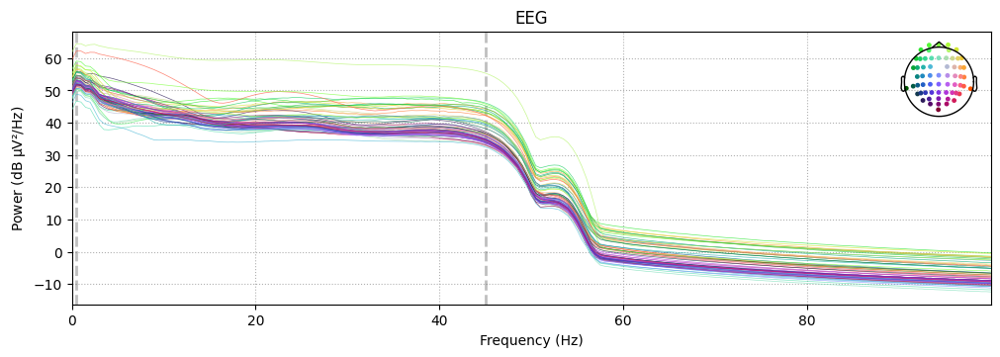

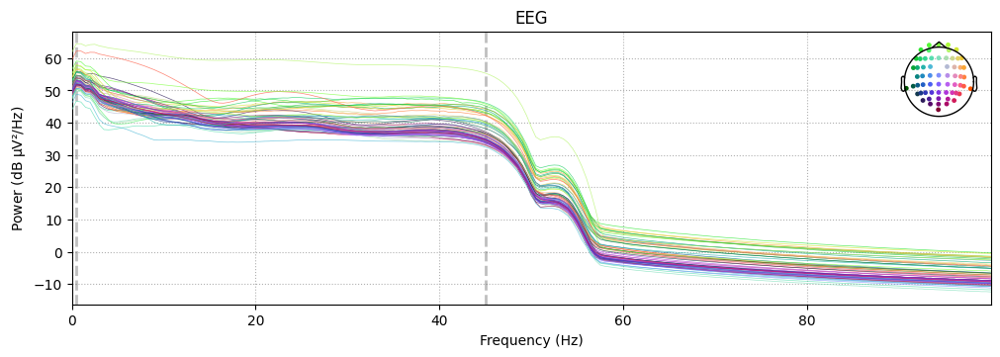

In [ ]:
f_epochs1.plot_psd(fmin=0,fmax=100)

<ipython-input-35-0efc5504cfb6>:2: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.
  ica_i2.fit(f_epochs1, verbose=False)


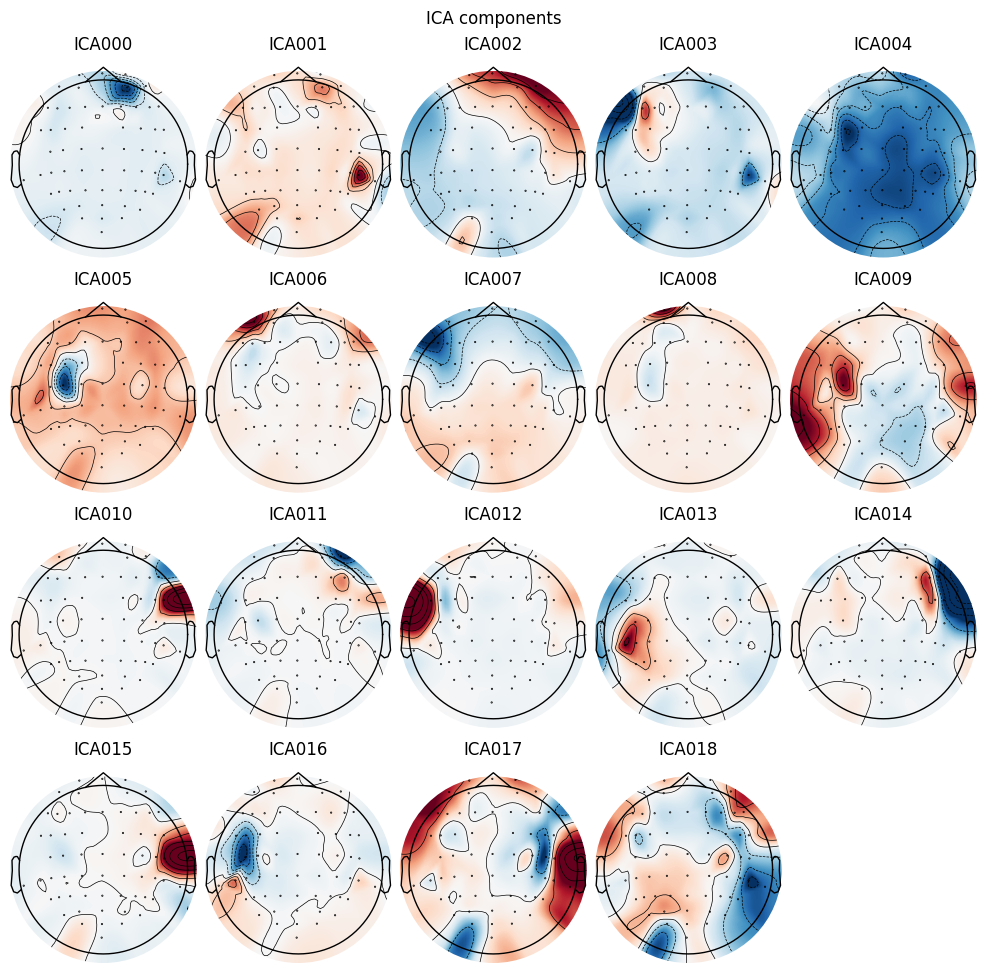

Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,75 iterations on epochs (1600160 samples)
ICA components,19
Available PCA components,61
Channel types,eeg
ICA components marked for exclusion,—


In [ ]:
ica_i2 = ICA(n_components= N, max_iter='auto', random_state=97, verbose=False)
ica_i2.fit(f_epochs1, verbose=False)
ica_i2.plot_components()
plt.show()
ica_i2

Not setting metadata
80 matching events found
No baseline correction applied
0 projection items activated


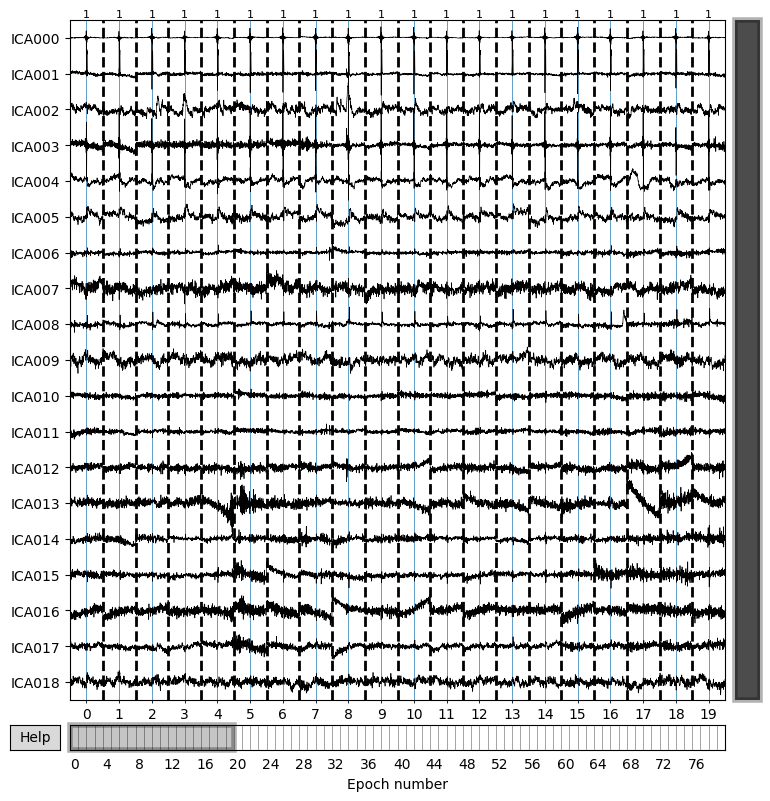

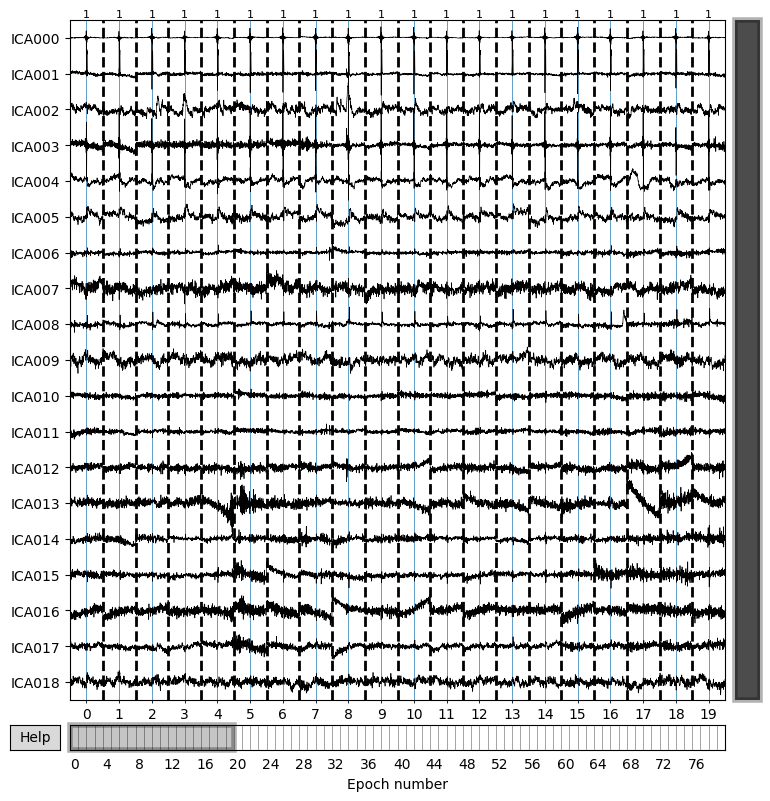

In [ ]:
ica_i2.plot_sources(f_epochs1)

In [ ]:
ica_i2.exclude = [0, 2]

Applying ICA to Evoked instance
    Transforming to ICA space (19 components)
    Zeroing out 2 ICA components
    Projecting back using 61 PCA components


<ipython-input-38-259268ba7628>:1: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  ica_i2.plot_overlay(f_epochs1.average(), exclude=ica_i2.exclude, picks="eeg")


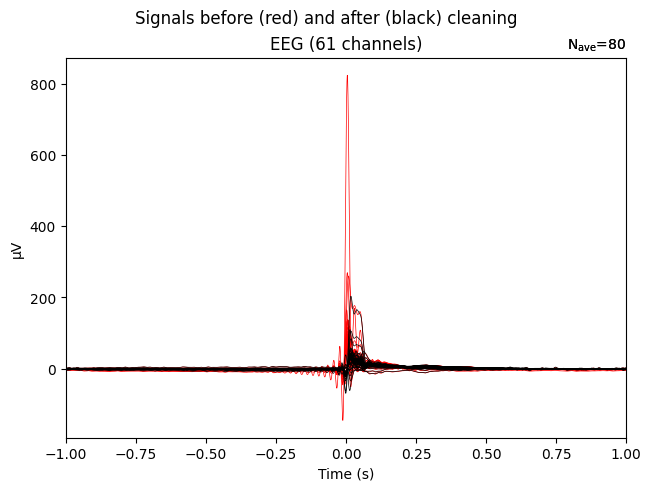

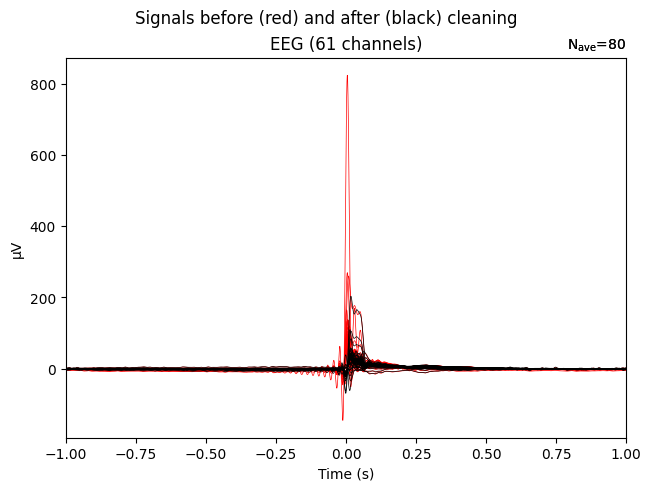

In [ ]:
ica_i2.plot_overlay(f_epochs1.average(), exclude=ica_i2.exclude, picks="eeg")

In [ ]:
ica_i2.apply(f_epochs1)

Applying ICA to Epochs instance


<ipython-input-39-157c911ac43a>:1: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  ica_i2.apply(f_epochs1)


    Transforming to ICA space (19 components)
    Zeroing out 2 ICA components
    Projecting back using 61 PCA components


<EpochsArray | 80 events (all good), -1 – 1 s (baseline -1 – -0.1 s), ~744.8 MB, data loaded,
 '1': 80>

In [ ]:
f_epochs1.interpolate_bads()#method="MNE")

Setting channel interpolation method to {'eeg': 'spline'}.


<ipython-input-40-552b32539f60>:1: RuntimeWarning: No bad channels to interpolate. Doing nothing...
  f_epochs1.interpolate_bads()#method="MNE")


<EpochsArray | 80 events (all good), -1 – 1 s (baseline -1 – -0.1 s), ~744.8 MB, data loaded,
 '1': 80>

In [ ]:
f_epochs1.set_eeg_reference('average')
f_epochs1.apply_baseline(baseline=(-0.5,-0.1))

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Applying baseline correction (mode: mean)


<EpochsArray | 80 events (all good), -1 – 1 s (baseline -0.5 – -0.1 s), ~744.8 MB, data loaded,
 '1': 80>

In [ ]:
f_epochs1.save('MI_epo.fif', overwrite=True)

In [ ]:
f_epochs1 = mne.read_epochs('/content/drive/MyDrive/MI_epo.fif')

Reading /content/drive/MyDrive/MI_epo.fif ...
    Found the data of interest:
        t =   -1000.00 ...    1000.10 ms
        0 CTF compensation matrices available
Not setting metadata
80 matching events found
No baseline correction applied
0 projection items activated


In [ ]:
f_epochs1 = f_epochs1.resample(500)
f_epochs1_ar = f_epochs1.get_data()

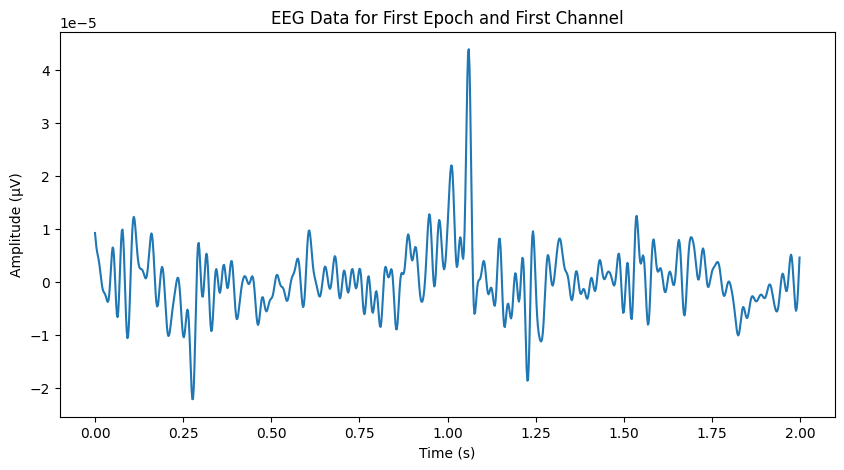

In [ ]:
#epoch_data = epochs_icaed.get_data()
first_epoch1 = f_epochs1_ar[0]  # First epoch
channel_data1 = first_epoch1[0]  # Data for the first channel

# Time vector based on sampling frequency
sfreq1 = f_epochs1.info['sfreq']
times1 = np.arange(0, len(channel_data1)) / sfreq1

# Plot
plt.figure(figsize=(10, 5))
plt.plot(times1, channel_data1)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.title('EEG Data for First Epoch and First Channel')
plt.show()

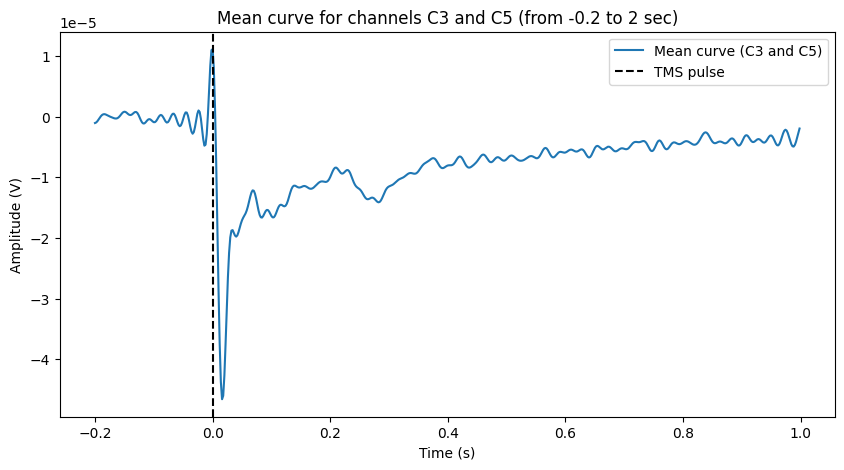

In [ ]:
channels_of_interest1 = ['C3', 'C5']
epochs_data1 = f_epochs1.get_data(picks=channels_of_interest1)  # Get data only for channels C3 and C5

# Average data across epochs
mean_data1 = np.mean(epochs_data1, axis=0)

# Mean of the two channels (C3 and C5)
mean_channels1 = np.mean(mean_data1, axis=0)

# Time in seconds
sfreq1 = f_epochs1.info['sfreq']
times1 = np.arange(mean_channels1.shape[0]) / sfreq1 + f_epochs1.tmin  # Add tmin to start time from -1 sec

# Indices for the time range from -0.2 to 2 seconds
start_idx1 = np.searchsorted(times1, -0.2)
end_idx1 = np.searchsorted(times1, 2.0)

# Slice the data and time
times_segment1 = times1[start_idx1:end_idx1]
mean_channels_segment1 = mean_channels1[start_idx1:end_idx1]

# Plotting the graph
plt.figure(figsize=(10, 5))
plt.plot(times_segment1, mean_channels_segment1, label='Mean curve (C3 and C5)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (V)')
plt.title('Mean curve for channels C3 and C5 (from -0.2 to 2 sec)')
plt.axvline(0, color='k', linestyle='--', label='TMS pulse')  # Vertical line at 0 to indicate the TMS pulse
plt.legend()
plt.show()

In [ ]:
epochse = mne.read_epochs('/content/drive/MyDrive/ME.fif', preload=True)

Reading /content/drive/MyDrive/ME.fif ...


<ipython-input-24-75e07312d950>:1: RuntimeWarning: This filename (/content/drive/MyDrive/ME.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochse = mne.read_epochs('/content/drive/MyDrive/ME.fif', preload=True)


    Found the data of interest:
        t =   -1000.00 ...    1000.00 ms
        0 CTF compensation matrices available
Not setting metadata
80 matching events found
No baseline correction applied
0 projection items activated


In [ ]:
data2 = epochse.get_data()  # Shape: (n_epochs, n_channels, n_times)
data2

array([[[ 4.50540501e-05,  5.71490309e-05,  5.61691122e-05, ...,
         -7.56784084e-06, -7.52146070e-06, -7.53801487e-06],
        [ 9.49741370e-05,  9.57693119e-05,  9.52603004e-05, ...,
         -1.27846442e-05, -3.10796713e-05, -2.83786012e-05],
        [-4.98080090e-06, -4.76182458e-06, -4.94894675e-06, ...,
          1.26821396e-05,  1.02547647e-05,  1.17493937e-05],
        ...,
        [-2.29301554e-06, -7.79805578e-06, -2.21482933e-05, ...,
          7.00165310e-06,  1.47328947e-05,  6.50341508e-06],
        [-2.72333436e-05, -2.72666148e-05, -2.72275647e-05, ...,
          1.77816291e-05,  2.17660945e-05,  8.72293913e-06],
        [-2.50859666e-05, -2.40833961e-05, -2.52603786e-05, ...,
          1.20004397e-05,  1.31829629e-05,  4.57886881e-06]],

       [[-2.73692967e-05, -2.74435133e-05, -2.73453898e-05, ...,
          3.24742396e-05,  2.29642628e-05,  3.87083928e-05],
        [-2.26489847e-05, -5.15119473e-06, -2.25422391e-05, ...,
          2.39313413e-05,  2.29802554e

In [ ]:
filtered_epochs2 = apply_wavelet_filter(data2)

Not setting metadata
80 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using matplotlib as 2D backend.


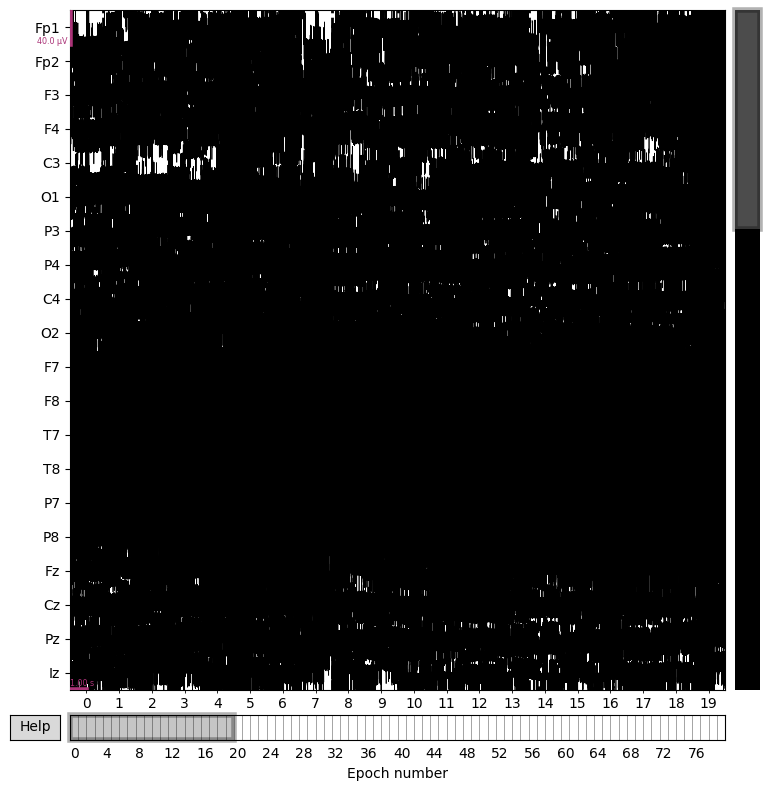

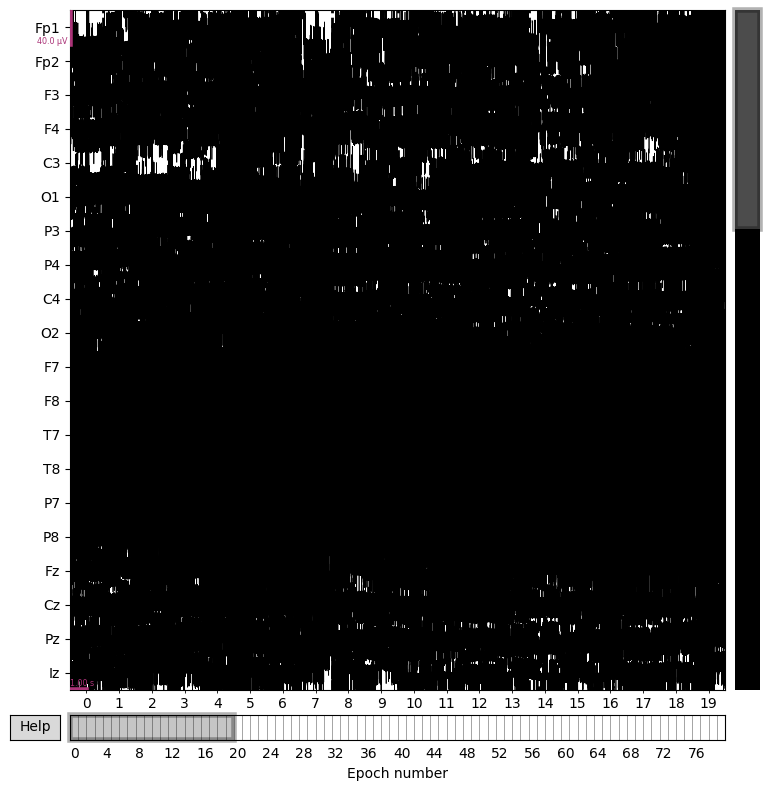

In [ ]:
filtered_epochs2 = mne.EpochsArray(
    filtered_epochs2,            # Your filtered data
    info=epochse.info,        # Original metadata
    events=epochse.events,     # Original events
    tmin=epochse.tmin,        # Original tmin
    baseline=epochse.baseline  # Original baseline
)
# Plot the filtered epochs
filtered_epochs2.plot()

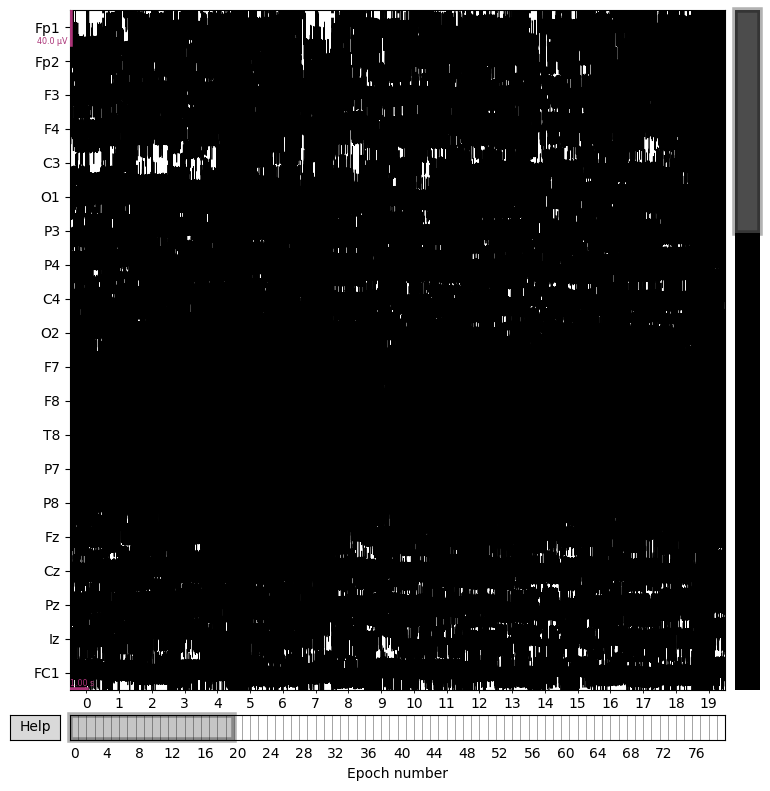

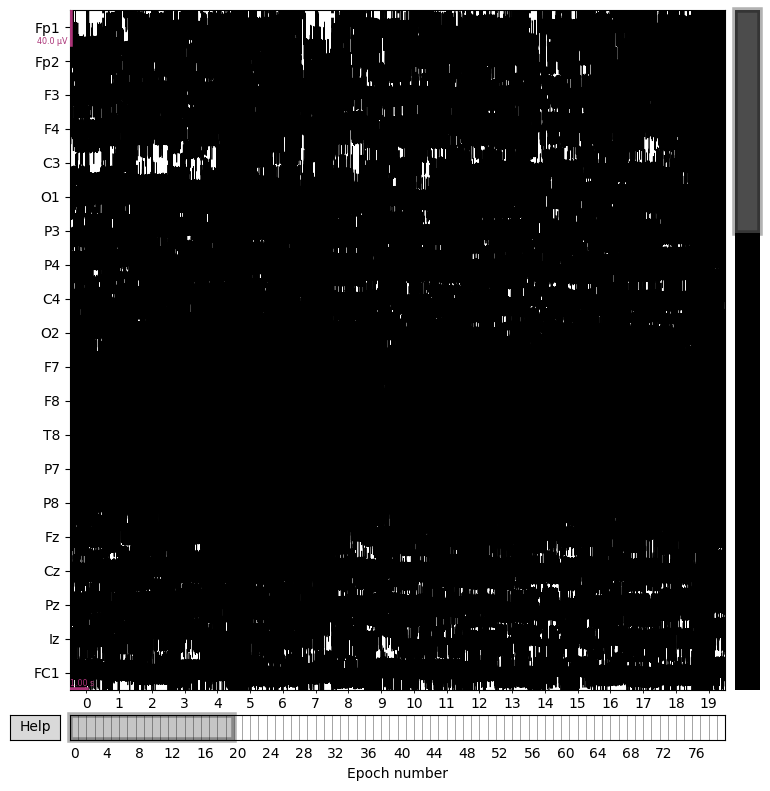

In [ ]:
ch_names = filtered_epochs2.ch_names
drop = 'T7'
filtered_epochs_new2 = filtered_epochs2.drop_channels(drop)
filtered_epochs_new2.plot()

<ipython-input-29-d1d9b7f8396a>:2: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  icae.fit(filtered_epochs_new2, verbose=False)
<ipython-input-29-d1d9b7f8396a>:2: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.
  icae.fit(filtered_epochs_new2, verbose=False)


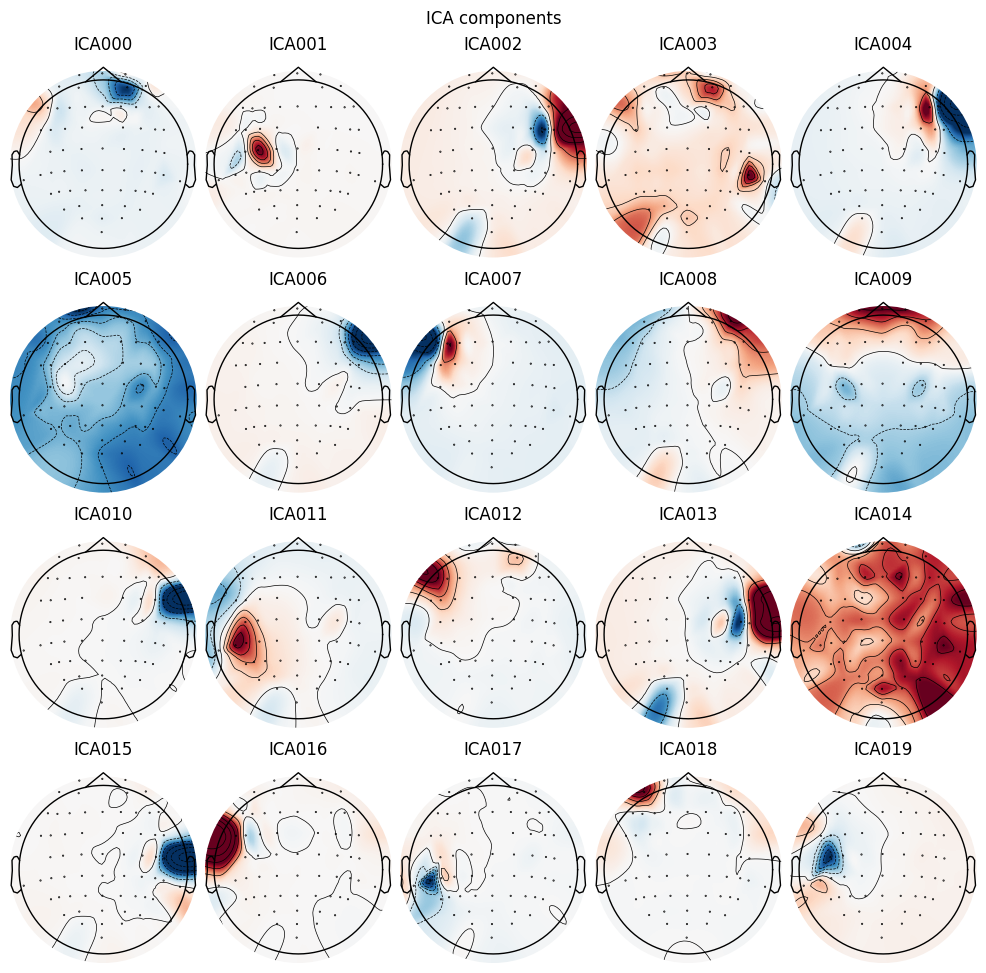

Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,36 iterations on epochs (1600160 samples)
ICA components,35
Available PCA components,61
Channel types,eeg
ICA components marked for exclusion,—


In [ ]:
icae = ICA(n_components=0.99, max_iter='auto', random_state=42, verbose=False)
icae.fit(filtered_epochs_new2, verbose=False)
icae.plot_components(picks=numbers)
plt.show()
icae

Not setting metadata
80 matching events found
No baseline correction applied
0 projection items activated


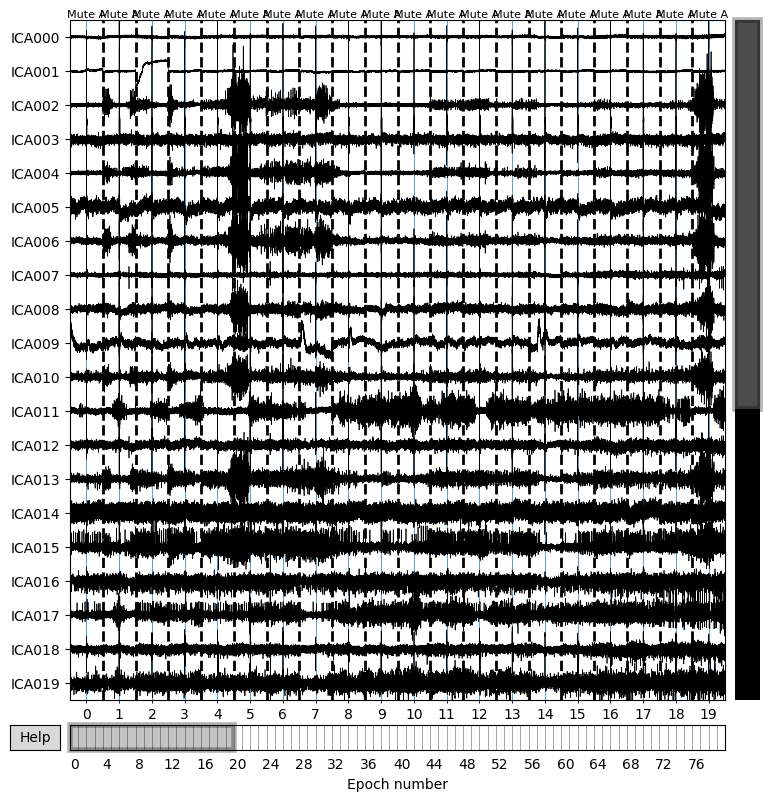

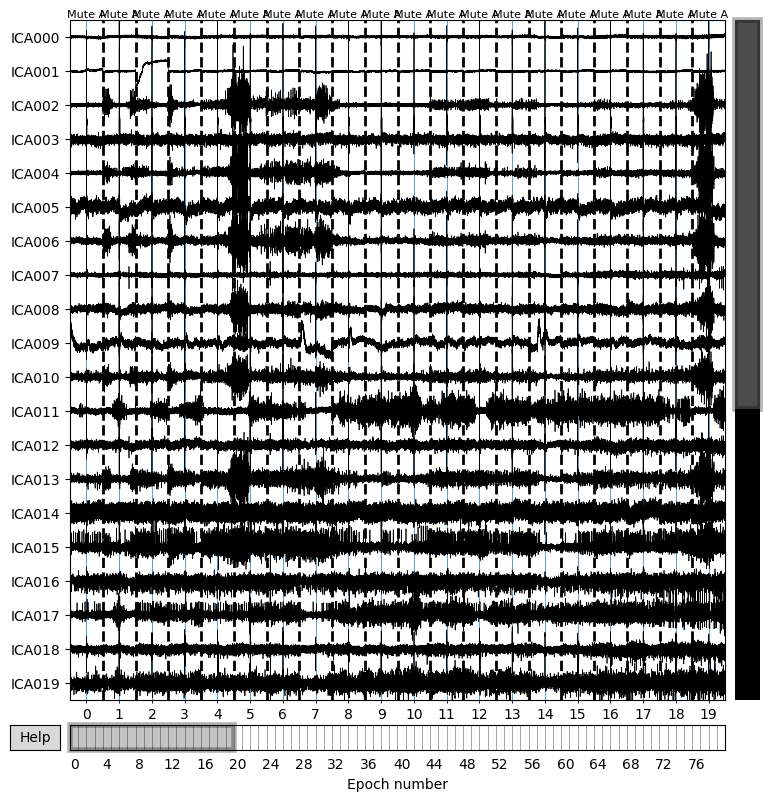

In [ ]:
icae.plot_sources(epochse)

In [ ]:
icae.exclude = [0,2,1,9]

Applying ICA to Evoked instance
    Transforming to ICA space (35 components)
    Zeroing out 4 ICA components
    Projecting back using 61 PCA components


<ipython-input-33-1561e08bade7>:1: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  icae.plot_overlay(epochse.average(), exclude=icae.exclude, picks="eeg")


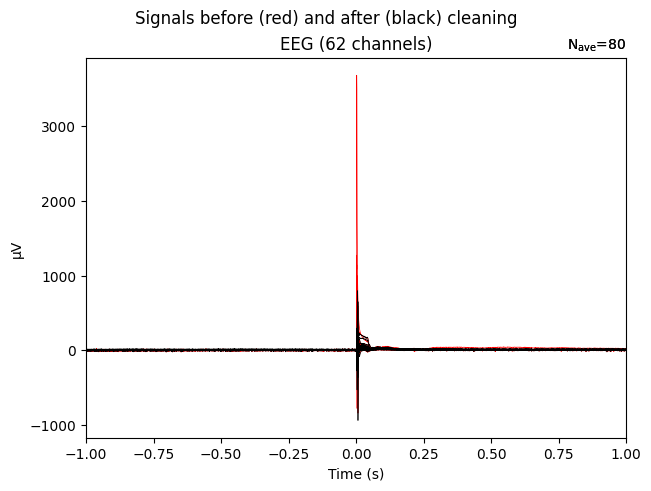

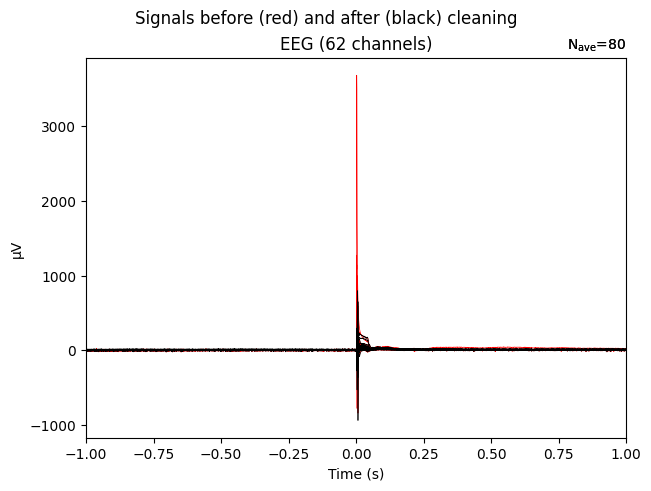

In [ ]:
icae.plot_overlay(epochse.average(), exclude=icae.exclude, picks="eeg")

In [ ]:
icae.apply(filtered_epochs_new2)

Applying ICA to Epochs instance


<ipython-input-34-4f73bc0d77f0>:1: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  icae.apply(filtered_epochs_new2)


    Transforming to ICA space (35 components)
    Zeroing out 4 ICA components
    Projecting back using 61 PCA components


<EpochsArray | 80 events (all good), -1 – 1 s (baseline -1 – -0.1 s), ~744.8 MB, data loaded,
 '1': 80>

In [ ]:
f_epochs2 = filtered_epochs_new2.apply_function(notch_filter_scipy, picks='all', dtype=np.float64, n_jobs=1, fs=fs, target_freq=target_freq, Q=Q)

In [ ]:
f_epochs2.filter(l_freq=0.5, h_freq=45)

Setting up band-pass filter from 0.5 - 45 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 45.00 Hz
- Upper transition bandwidth: 11.25 Hz (-6 dB cutoff frequency: 50.62 Hz)
- Filter length: 66001 samples (6.600 s)



<ipython-input-36-1dd68d463bed>:1: RuntimeWarning: filter_length (66001) is longer than the signal (20002), distortion is likely. Reduce filter length or filter a longer signal.
  f_epochs2.filter(l_freq=0.5, h_freq=45)
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    1.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    1.7s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    2.6s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    3.7s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    5.0s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    7.1s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    9.6s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:   11.8s
[Parallel(n_jobs=1)]: Done 2177 tasks      | elapsed:   14.0s
[Parallel(n_jobs=1)]: Done 2591 tasks      | elapsed:   16.4s
[Parallel(n_jobs=1)]: Done 3041 tasks      

<EpochsArray | 80 events (all good), -1 – 1 s (baseline -1 – -0.1 s), ~744.8 MB, data loaded,
 '1': 80>

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Plotting power spectral density (dB=True).
Averaging across epochs before plotting...


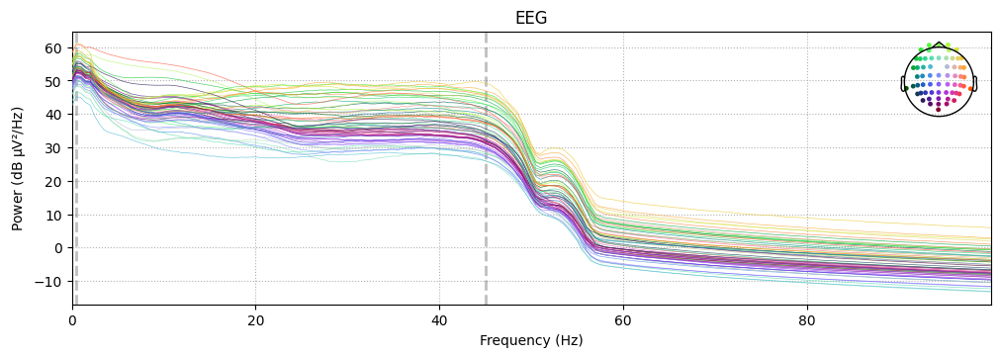

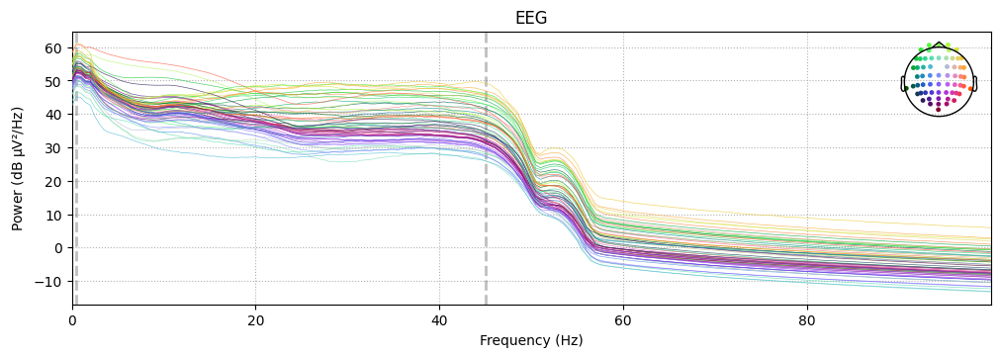

In [ ]:
f_epochs2.plot_psd(fmin=0,fmax=100)

<ipython-input-38-688425ad048d>:2: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.
  ica_e2.fit(f_epochs2, verbose=False)


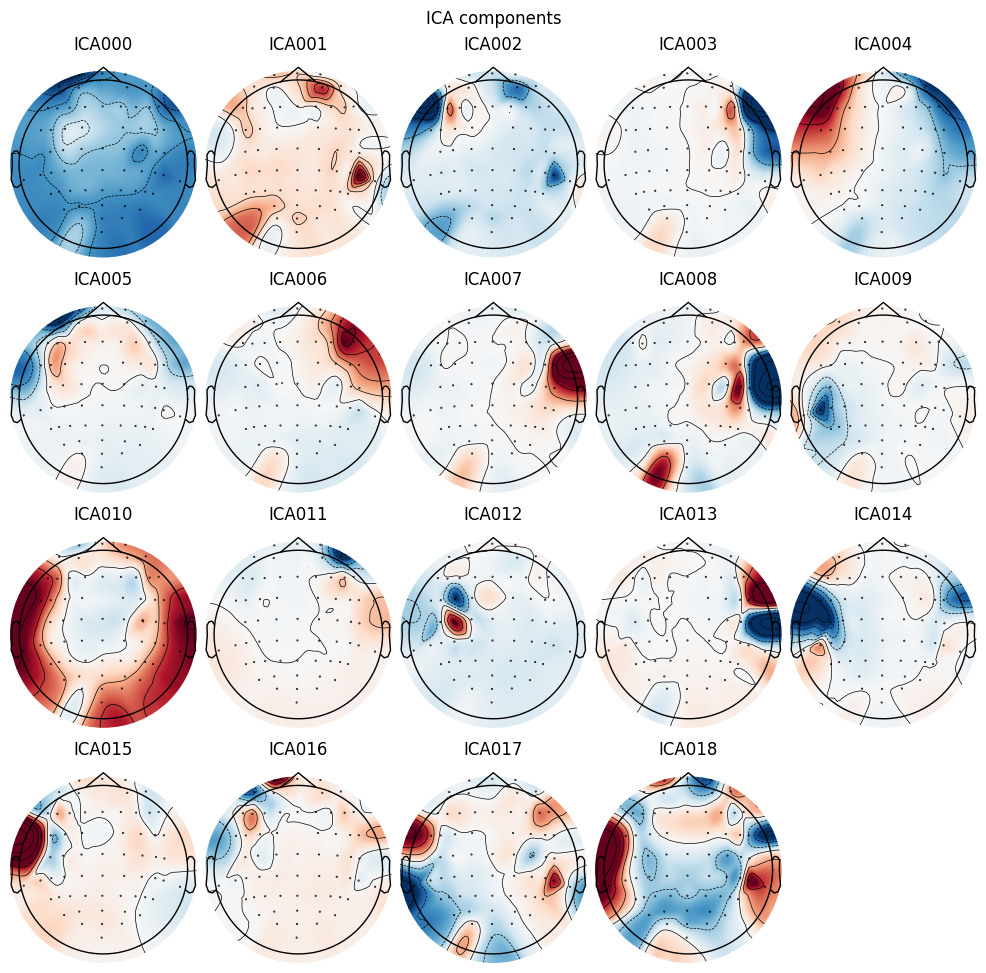

Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,28 iterations on epochs (1600160 samples)
ICA components,19
Available PCA components,61
Channel types,eeg
ICA components marked for exclusion,—


In [ ]:
ica_e2 = ICA(n_components= N, max_iter='auto', random_state=97, verbose=False)
ica_e2.fit(f_epochs2, verbose=False)
ica_e2.plot_components()
plt.show()
ica_e2

Not setting metadata
80 matching events found
No baseline correction applied
0 projection items activated


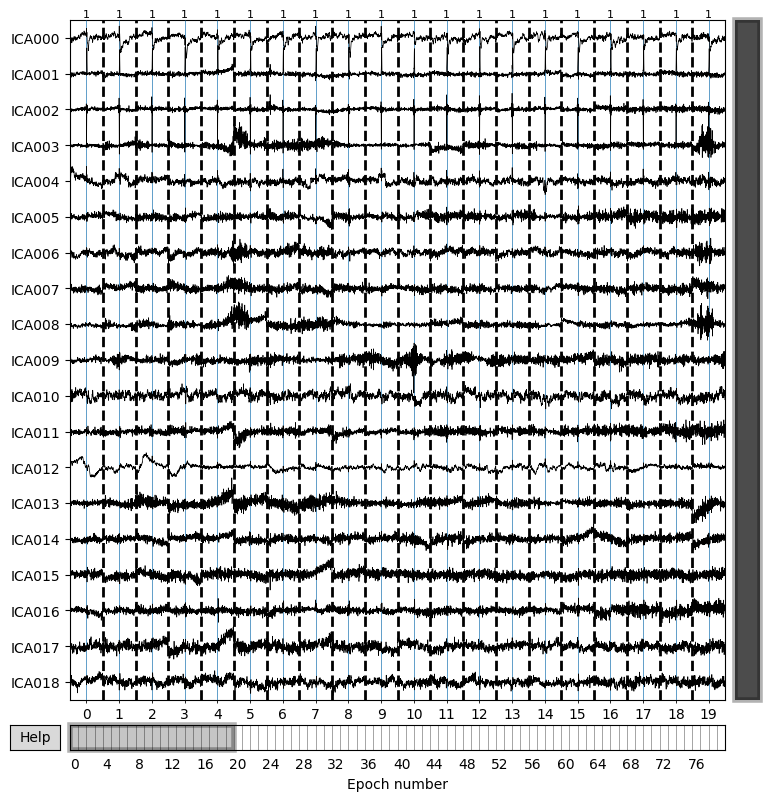

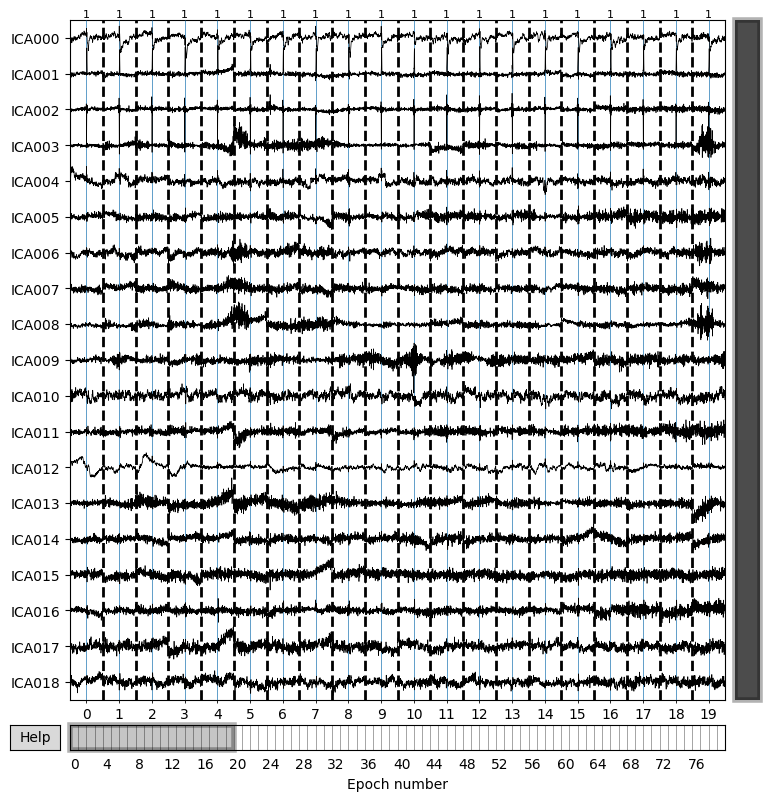

In [ ]:
ica_e2.plot_sources(f_epochs2)

In [ ]:
ica_e2.exclude = [0,2,4]

Applying ICA to Evoked instance
    Transforming to ICA space (19 components)
    Zeroing out 3 ICA components
    Projecting back using 61 PCA components


<ipython-input-41-05d226b387c5>:1: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  ica_e2.plot_overlay(f_epochs2.average(), exclude=ica_e2.exclude, picks="eeg")


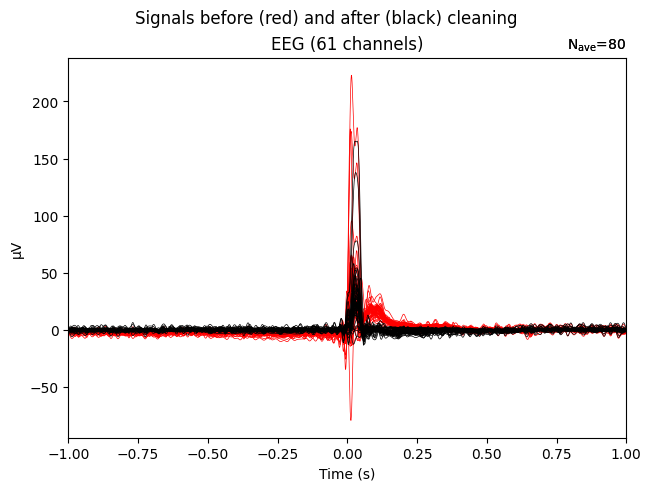

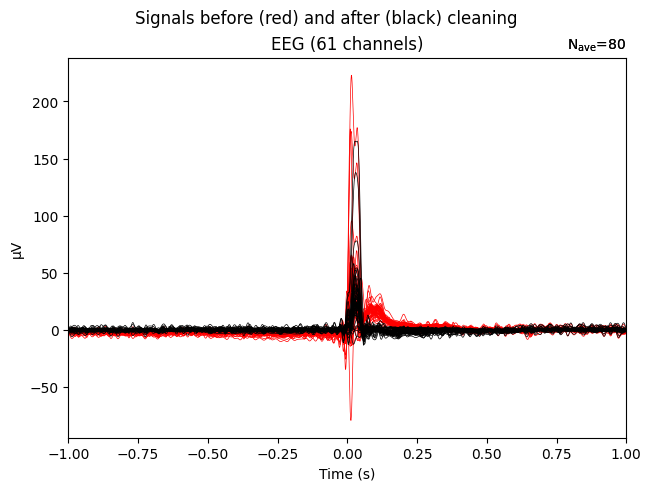

In [ ]:
ica_e2.plot_overlay(f_epochs2.average(), exclude=ica_e2.exclude, picks="eeg")

In [ ]:
ica_e2.apply(f_epochs2)

Applying ICA to Epochs instance


<ipython-input-43-e0c593a28017>:1: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  ica_e2.apply(f_epochs2)


    Transforming to ICA space (19 components)
    Zeroing out 3 ICA components
    Projecting back using 61 PCA components


<EpochsArray | 80 events (all good), -1 – 1 s (baseline -1 – -0.1 s), ~744.8 MB, data loaded,
 '1': 80>

In [ ]:
f_epochs2.interpolate_bads()#method="MNE")

Setting channel interpolation method to {'eeg': 'spline'}.


<ipython-input-44-1c003d35f3f9>:1: RuntimeWarning: No bad channels to interpolate. Doing nothing...
  f_epochs2.interpolate_bads()#method="MNE")


<EpochsArray | 80 events (all good), -1 – 1 s (baseline -1 – -0.1 s), ~744.8 MB, data loaded,
 '1': 80>

In [ ]:
f_epochs2.set_eeg_reference('average')
f_epochs2.apply_baseline(baseline=(-0.5,-0.1))

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Applying baseline correction (mode: mean)


<EpochsArray | 80 events (all good), -1 – 1 s (baseline -0.5 – -0.1 s), ~744.8 MB, data loaded,
 '1': 80>

In [ ]:
f_epochs2.save('ME_epo.fif', overwrite=True)

In [ ]:
f_epochs2 = mne.read_epochs('/content/drive/MyDrive/ME_epo.fif')

Reading /content/drive/MyDrive/ME_epo.fif ...
    Found the data of interest:
        t =   -1000.00 ...    1000.10 ms
        0 CTF compensation matrices available
Not setting metadata
80 matching events found
No baseline correction applied
0 projection items activated


In [ ]:
f_epochs2 = f_epochs2.resample(500)
f_epochs2_ar = f_epochs2.get_data()

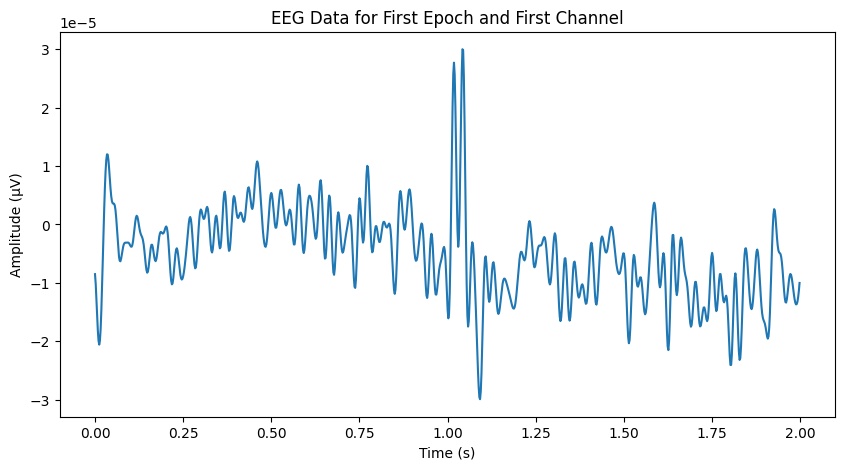

In [ ]:
first_epoch2 = f_epochs2_ar[0]  # First epoch
channel_data2 = first_epoch2[0]  # Data for the first channel

# Time vector based on sampling frequency
sfreq2 = f_epochs2.info['sfreq']
times2 = np.arange(0, len(channel_data2)) / sfreq2

# Plot
plt.figure(figsize=(10, 5))
plt.plot(times2, channel_data2)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.title('EEG Data for First Epoch and First Channel')
plt.show()

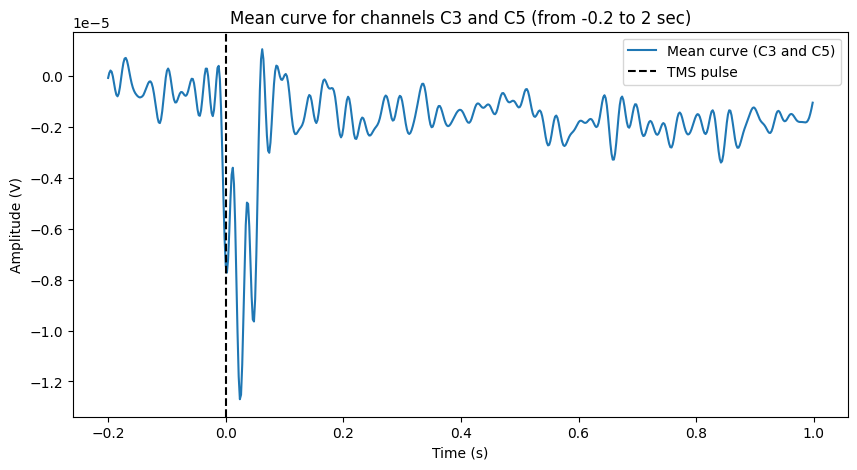

In [ ]:
channels_of_interest2 = ['C3', 'C5']
epochs_data2 = f_epochs2.get_data(picks=channels_of_interest2)  # Get data only for channels C3 and C5

# Average data across epochs
mean_data2 = np.mean(epochs_data2, axis=0)

# Mean of the two channels (C3 and C5)
mean_channels2 = np.mean(mean_data2, axis=0)

# Time in seconds
sfreq2 = f_epochs2.info['sfreq']
times2 = np.arange(mean_channels2.shape[0]) / sfreq2 + f_epochs2.tmin  # Add tmin to start time from -1 sec

# Indices for the time range from -0.2 to 2 seconds
start_idx2 = np.searchsorted(times2, -0.2)
end_idx2 = np.searchsorted(times2, 2.0)

# Slice the data and time
times_segment2 = times2[start_idx2:end_idx2]
mean_channels_segment2 = mean_channels2[start_idx2:end_idx2]

# Plotting the graph
plt.figure(figsize=(10, 5))
plt.plot(times_segment2, mean_channels_segment2, label='Mean curve (C3 and C5)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (V)')
plt.title('Mean curve for channels C3 and C5 (from -0.2 to 2 sec)')
plt.axvline(0, color='k', linestyle='--', label='TMS pulse')  # Vertical line at 0 to indicate the TMS pulse
plt.legend()
plt.show()

# **IMPORTANT PART**

# FOR REAL

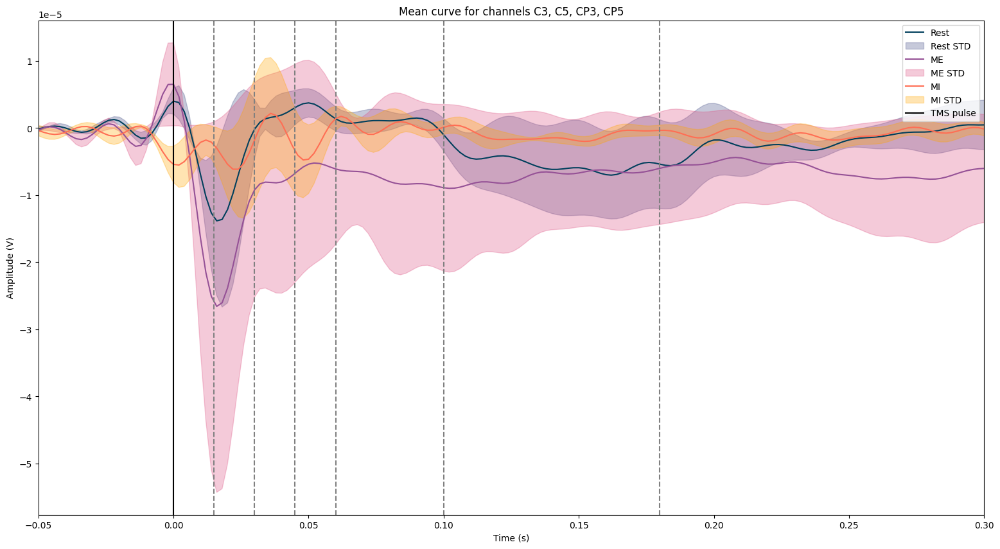

In [ ]:
# Rest
#channels_of_interest = ["CP3", "C3", "C5"]
channels_of_interest = ["C3", "C5", "CP3", "CP5"] # - the best one?
# ["C3", "C5", "CP3", "CP5"]
# ["C1", "C3", "C5", "CP1", "CP3", "CP5", "FC1", "FC3", "FC5"]

epochs_data = epochs_icaed.get_data(picks=channels_of_interest)
mean_channels = np.mean(np.mean(epochs_data, axis=0), axis=0)
times = np.arange(mean_channels.shape[0]) / epochs_icaed.info['sfreq'] + epochs_icaed.tmin  # Add tmin to start time from -1 sec
times_segment = times[np.searchsorted(times, -0.2):np.searchsorted(times, 2.0)]
mean_channels_segment = mean_channels[np.searchsorted(times, -0.2):np.searchsorted(times, 2.0)]

std = np.mean(epochs_data, axis=0).std(axis=0)
times = np.arange(std.shape[0]) / epochs_icaed.info['sfreq'] + epochs_icaed.tmin
times_segment = times[np.searchsorted(times, -0.2):np.searchsorted(times, 2.0)]
std_segm = std[np.searchsorted(times, -0.2):np.searchsorted(times, 2.0)]


# ME
epochs_datam = f_epochs1.get_data(picks=channels_of_interest)
mean_channelsm = np.mean(np.mean(epochs_datam, axis=0), axis=0)
timesm = np.arange(mean_channelsm.shape[0]) / f_epochs1.info['sfreq'] + f_epochs1.tmin
times_segmentm = timesm[np.searchsorted(timesm, -0.2):np.searchsorted(timesm, 2.0)]
mean_channels_segmentm = mean_channelsm[np.searchsorted(timesm, -0.2):np.searchsorted(timesm, 2.0)]

stdm = np.mean(epochs_datam, axis=0).std(axis=0)
timesm = np.arange(stdm.shape[0]) / f_epochs1.info['sfreq'] + f_epochs1.tmin
times_segment = timesm[np.searchsorted(timesm, -0.2):np.searchsorted(timesm, 2.0)]
std_segmm = stdm[np.searchsorted(timesm, -0.2):np.searchsorted(timesm, 2.0)]


#MI
epochs_datai = f_epochs2.get_data(picks=channels_of_interest)
mean_channelsi = np.mean(np.mean(epochs_datai, axis=0), axis=0)
timesi = np.arange(mean_channelsi.shape[0]) / f_epochs2.info['sfreq'] + f_epochs2.tmin  # Add tmin to start time from -1 sec
times_segmenti = timesi[np.searchsorted(timesi, -0.2):np.searchsorted(timesi, 2.0)]
mean_channels_segmenti = mean_channelsi[np.searchsorted(timesi, -0.2):np.searchsorted(timesi, 2.0)]

stdi = np.mean(epochs_datai, axis=0).std(axis=0)
timesi = np.arange(stdi.shape[0]) / f_epochs2.info['sfreq'] + f_epochs2.tmin
times_segment = times[np.searchsorted(timesi, -0.2):np.searchsorted(timesi, 2.0)]
std_segmi = stdi[np.searchsorted(timesi, -0.2):np.searchsorted(timesi, 2.0)]


#plot
plt.figure(figsize=(19, 10)) # (10,5)
plt.plot(times_segment, mean_channels_segment, label='Rest', color='#003f5c', linestyle='-')
plt.fill_between(times_segment, mean_channels_segment-std_segm, mean_channels_segment+std_segm, label='Rest STD', color='#444e86', alpha=0.3)
plt.plot(times_segmentm, mean_channels_segmentm, label='ME', color='#955196', linestyle='-')
plt.fill_between(times_segmentm, mean_channels_segmentm-std_segmm, mean_channels_segmentm+std_segmm, label='ME STD', color='#dd5182', alpha=0.3)
plt.plot(times_segmenti, mean_channels_segmenti, label='MI', color='#ff6e54', linestyle='-')
plt.fill_between(times_segmenti, mean_channels_segmenti-std_segmi, mean_channels_segmenti+std_segmi, label='MI STD', color='#ffa600', alpha=0.3)


plt.xlabel('Time (s)')
plt.ylabel('Amplitude (V)')
plt.title(f'Mean curve for channels {", ".join(channels_of_interest)}')
plt.axvline(0, color='k', linestyle='-', label='TMS pulse')  # Vertical line at 0 to indicate the TMS pulse
plt.axvline(0.015, color='grey', linestyle='--')
plt.axvline(0.030, color='grey', linestyle='--')
plt.axvline(0.045, color='grey', linestyle='--')
plt.axvline(0.060, color='grey', linestyle='--')
plt.axvline(0.100, color='grey', linestyle='--')
plt.axvline(0.180, color='grey', linestyle='--')
plt.legend()
plt.xlim(-0.05,0.3)
plt.show()

#plt.savefig(f'D:/Skoltech/term 5/NeuroLab/total_mean_std {", ".join(channels_of_interest)}.png')

Usage of wavelet filtering gives no advantage whatsoever.

# **EEGNET classification**

Let's check whether EEGNet will be able to distinguish between 3 types of stimuli present in our experiments.

In [ ]:
f_epochs1.events[:, -1] = 1  # 'Imagery'
f_epochs2.events[:, -1] = 2  # 'Motor evoked'
epochs_icaed.events[:, -1] = 3  # 'Rest'

In [ ]:
f_epochs2.apply_baseline(baseline=(-0.5,-0.1))
f_epochs1.apply_baseline(baseline=(-0.5,-0.1))
epochs_icaed.apply_baseline(baseline=(-0.5,-0.1))

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


<EpochsFIF | 80 events (all good), -1 – 0.998 s (baseline -0.5 – -0.1 s), ~37.3 MB, data loaded,
 'Rest': 0>

In [ ]:
print(f_epochs1.get_data().shape)
print(f_epochs2.get_data().shape)
print(epochs_icaed.get_data().shape)


(80, 61, 1000)
(80, 61, 1000)
(80, 61, 1000)


In [ ]:
f_epochs1.events[:, -1] = 1
f_epochs2.events[:, -1] = 1
epochs_icaed.events[:, -1] = 1
combined_epochs = mne.concatenate_epochs([f_epochs1, f_epochs2, epochs_icaed])



Not setting metadata
240 matching events found
Applying baseline correction (mode: mean)


In [ ]:
combined_epochs.events[:len(f_epochs1), -1] = 1  # Imagery
combined_epochs.events[len(f_epochs1):len(f_epochs1)+len(f_epochs2), -1] = 2  # Motor evoked
combined_epochs.events[len(f_epochs1)+len(f_epochs2):, -1] = 3  # Rest


In [ ]:
X = combined_epochs.get_data()  # Shape: (n_epochs, n_channels, n_times)
y = combined_epochs.events[:, -1]  # Extract event IDs as labels

#X = X[:, np.newaxis, :, :]
# One-hot encode the labels for training the model
from tensorflow.keras.utils import to_categorical
y = to_categorical(y - 1, num_classes=3)

In [ ]:
len(combined_epochs.event_id)

3

In [ ]:
combined_epochs

In [ ]:
from sklearn.model_selection import train_test_split
from EEGModels import EEGNet

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = EEGNet(nb_classes=len(combined_epochs.event_id), Chans=X.shape[1], Samples=X.shape[2])
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

model.fit(X_train, y_train, epochs=100, batch_size=16)

test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f"Test accuracy: {test_accuracy}")

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step - accuracy: 0.3286 - loss: 1.0983
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 21s 1s/step - accuracy: 0.4238 - loss: 1.0916
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 20s 1s/step - accuracy: 0.6017 - loss: 1.0620
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step - accuracy: 0.6387 - loss: 0.9527
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 19s 986ms/step - accuracy: 0.6565 - loss: 0.7894
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step - accuracy: 0.7803 - loss: 0.6393
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 19s 995ms/step - accuracy: 0.8037 - loss: 0.6181
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step - accuracy: 0.8495 - loss: 0.5215
Epoch 9/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 19s 937ms/step - accuracy: 0.8540 - loss: 0.4800
Epoch 10/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step - accuracy: 0.9036 - loss: 0.4330
Epoch 11/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 20s 1s/step - accuracy: 0.9102 - loss: 0.3878
Epoch 12/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step - 

Obviously, something is wrong. Probably overfitting or data leakage or something among the likes of them. Let's try using K-fold to see the real perfomance.

In [ ]:
from sklearn.model_selection import KFold
kf = KFold(n_splits=5, shuffle=True, random_state=42)
accuracies = []

# Cross-Validation
for train_index, test_index in kf.split(X):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    model = EEGNet(nb_classes=len(combined_epochs.event_id), Chans=X.shape[1], Samples=X.shape[2])
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

    model.fit(X_train, y_train, epochs=100, batch_size=16, verbose=0)


    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    accuracies.append(test_accuracy)

print(f"Average Test Accuracy: {np.mean(accuracies) * 100:.2f}%")

Average Test Accuracy: 76.25%


Now it seems realistic and actually this result is fairly reasonable since there is a little difference between MI and REST events. Sorry, I usually don't have fantasies about moving muscles therefore I'm not experienced in this sort of tortures

We can try to make our own CNN based on torch instead of god-forbidden tensorflow but it would require a lot of experimentation to figure out optimal architecture (or we can just copy EEGNet but what is the reason for that)

In [ ]:
import torch
from sklearn.model_selection import train_test_split


X = X[:, np.newaxis, :, :]  # Shape: (n_epochs, 1, n_channels, n_times)
X = torch.tensor(X, dtype=torch.float32)
y = torch.tensor(np.argmax(y, axis=1), dtype=torch.long)  # Assuming y is one-hot encoded


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [ ]:
import torch.nn as nn
import torch.optim as optim

class SimpleCNN(nn.Module):
    def __init__(self):
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        # Do not hardcode the input size for fc1 yet, it will be calculated in forward
        self.fc1 = None
        self.fc2 = nn.Linear(128, 3)

    def forward(self, x):
        x = self.pool(torch.relu(self.conv1(x)))
        x = self.pool(torch.relu(self.conv2(x)))

        # Print shape to calculate input size for fc1
        print(x.shape)  # Use this to determine the correct input size

        # Flatten the output of conv2 before feeding into fully connected layers
        x = x.view(x.size(0), -1)  # Flatten

        # Only initialize fc1 once we know the shape
        if self.fc1 is None:
            self.fc1 = nn.Linear(x.size(1), 128)  # Dynamically set the input size

        x = torch.relu(self.fc1(x))
        x = self.fc2(x)
        return x

In [ ]:
model = SimpleCNN()
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training loop
num_epochs = 50
batch_size = 16

for epoch in range(num_epochs):
    model.train()
    permutation = torch.randperm(X_train.size()[0])

    for i in range(0, X_train.size()[0], batch_size):
        indices = permutation[i:i + batch_size]
        batch_x, batch_y = X_train[indices], y_train[indices]

        # Forward pass
        outputs = model(batch_x)
        loss = criterion(outputs, batch_y)

        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

torch.Size([16, 64, 15, 250])
torch.Size([16, 64, 15, 250])
torch.Size([16, 64, 15, 250])
torch.Size([16, 64, 15, 250])
torch.Size([16, 64, 15, 250])
torch.Size([16, 64, 15, 250])
torch.Size([16, 64, 15, 250])
torch.Size([16, 64, 15, 250])
torch.Size([16, 64, 15, 250])
torch.Size([16, 64, 15, 250])
torch.Size([16, 64, 15, 250])
torch.Size([16, 64, 15, 250])
Epoch [1/50], Loss: 1.0915
torch.Size([16, 64, 15, 250])
torch.Size([16, 64, 15, 250])
torch.Size([16, 64, 15, 250])
torch.Size([16, 64, 15, 250])
torch.Size([16, 64, 15, 250])
torch.Size([16, 64, 15, 250])
torch.Size([16, 64, 15, 250])
torch.Size([16, 64, 15, 250])
torch.Size([16, 64, 15, 250])
torch.Size([16, 64, 15, 250])
torch.Size([16, 64, 15, 250])
torch.Size([16, 64, 15, 250])
Epoch [2/50], Loss: 1.1020
torch.Size([16, 64, 15, 250])
torch.Size([16, 64, 15, 250])
torch.Size([16, 64, 15, 250])
torch.Size([16, 64, 15, 250])
torch.Size([16, 64, 15, 250])
torch.Size([16, 64, 15, 250])
torch.Size([16, 64, 15, 250])
torch.Size([16, 

In [ ]:
model.eval()
with torch.no_grad():
    test_outputs = model(X_test)
    _, predicted = torch.max(test_outputs.data, 1)
    accuracy = (predicted == y_test).sum().item() / y_test.size(0)
    print(f'Test Accuracy: {accuracy * 100:.2f}%')

torch.Size([48, 64, 15, 250])
Test Accuracy: 31.25%


well we tried